# FOOD PRODUCTION AND SUPPLY IN AFRICA ANALYSIS

###  INTRODUCTION

Africa is not only the second-largest continent by land area and population, but also the home of a remarkable diversity of cultures, languages, and religions.

Agriculture is by far the single most important economic activity in Africa. It provides employment for about two-thirds of the continent’s working population and for each country contributes an average of 30 to 60 percent of gross domestic product and about 30 percent of the value of exports.

Peasant and subsistence farming is the basic form of agriculture in most parts of the continent. However, agriculture in Africa faces challenges such as low productivity, land degradation, climate change, gender inequality, and malnutrition. Several initiatives and organizations are working to improve the sector and help Africa reach its potential

In this project,  we will be analyzing two datasets which contains information of food production and food supply from 2004 to 2013 in 45 African countries. For pattern recognition and storytelling, and their relationship

# Objective of the project

Using Python as the choice language for data analysis and visualisations, the aim of this project is to tell a story of how the world food shortage problem can be solved using appropriate visuals making each variable in the dataset purposeful without leaving anything behind

To have a guide in this project i will be getting the following insights in both the food production and food supply data


1. Which Country produces food the most


2. Food that were produced the most / least


3. What Food Did Nigeria Produce more from 2004 to 2013


4. What Food Did Egypt Produce more from 2004 to 2013


5. What Food Did South Africa Produce more from 2004 to 2013


6. Who are the Top Cassava, Sugar cane, Maize and products producing countries


7. Top Rice producing countries


8. Did Food production in Africa from 2004 to 2013 Decrease or Increase


9. Country that suppied food the most


10. Did Yearly food supply in Africa from 2004 to 2013 increase or decrease?


11. Detecting Outliers


12. Hypothesis testing to determiene if Rice production increase as the population increases?


13. Relationship between food production and food supply


In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from scipy.stats import pearsonr
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
%matplotlib inline
plt.style.use("ggplot")
import datetime as dt
import plotly.express as px
import plotly.graph_objects as go



import warnings
warnings.filterwarnings('ignore')

In [2]:
food_production= pd.read_csv(r"C:\Users\chine\Downloads\Raw Data\Africa Food Production (2004 - 2013).csv")
food_production

,Country,Item,Year,Value
0,Algeria,Wheat and products,2004,2731
1,Algeria,Wheat and products,2005,2415
2,Algeria,Wheat and products,2006,2688
3,Algeria,Wheat and products,2007,2319
4,Algeria,Wheat and products,2008,1111
...,...,...,...,...
23105,Zimbabwe,Crustaceans,2009,0
23106,Zimbabwe,Crustaceans,2010,0
23107,Zimbabwe,Crustaceans,2011,0
23108,Zimbabwe,Crustaceans,2012,0


# Data Overview

In [3]:
food_production.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23110 entries, 0 to 23109
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Country  23110 non-null  object
 1   Item     23110 non-null  object
 2   Year     23110 non-null  int64 
 3   Value    23110 non-null  int64 
dtypes: int64(2), object(2)
memory usage: 722.3+ KB


In [4]:
food_production.describe()

,Year,Value
count,23110.000000,23110.000000
mean,2008.498269,327.785201
std,2.871740,1607.940343
min,2004.000000,0.000000
25%,2006.000000,3.000000
50%,2008.000000,18.000000
75%,2011.000000,108.000000
max,2013.000000,54000.000000


In [5]:
food_production.dtypes

Country    object
Item       object
Year        int64
Value       int64
dtype: object

In [6]:
food_production.isnull().sum()

Country    0
Item       0
Year       0
Value      0
dtype: int64

In [7]:
food_production.duplicated().sum()

0

In [8]:
# check the number of unique values in each columns
food_production.nunique()

Country      45
Item         94
Year         10
Value      2134
dtype: int64

# Data Cleaning

In [9]:
# converting the Year column to datetime
food_production['Year'] = pd.to_datetime(food_production['Year'], format="%Y").dt.year

In [10]:
# checking datatype
food_production.dtypes

Country    object
Item       object
Year        int64
Value       int64
dtype: object

In [11]:
# create a unit column containing the symbol of kilotone, which is the unit of the numbers in the Value column
food_production['Unit'] = 'kt'

In [12]:
# confirming if the column has been added
food_production

,Country,Item,Year,Value,Unit
0,Algeria,Wheat and products,2004,2731,kt
1,Algeria,Wheat and products,2005,2415,kt
2,Algeria,Wheat and products,2006,2688,kt
3,Algeria,Wheat and products,2007,2319,kt
4,Algeria,Wheat and products,2008,1111,kt
...,...,...,...,...,...
23105,Zimbabwe,Crustaceans,2009,0,kt
23106,Zimbabwe,Crustaceans,2010,0,kt
23107,Zimbabwe,Crustaceans,2011,0,kt
23108,Zimbabwe,Crustaceans,2012,0,kt


In [13]:
#checking data type again
food_production.dtypes

Country    object
Item       object
Year        int64
Value       int64
Unit       object
dtype: object

In [14]:
# groupby Country and year to see the total value for each product for different years
prod = food_production.groupby(['Country', 'Year'])
prod.first()

Item  Value Unit
Country  Year                                
Algeria  2004  Wheat and products   2731   kt
         2005  Wheat and products   2415   kt
         2006  Wheat and products   2688   kt
         2007  Wheat and products   2319   kt
         2008  Wheat and products   1111   kt
...                           ...    ...  ...
Zimbabwe 2009  Wheat and products     12   kt
         2010  Wheat and products     18   kt
         2011  Wheat and products     23   kt
         2012  Wheat and products     20   kt
         2013  Wheat and products     25   kt

[450 rows x 3 columns]

In [15]:
# Group by Country, Year and Value to see the sum of items produced each year in each country
pd.DataFrame(food_production.groupby(['Country','Year'])['Value'].sum())

Value
Country  Year       
Algeria  2004  15536
         2005  15667
         2006  16417
         2007  14763
         2008  13841
...              ...
Zimbabwe 2009   5754
         2010   6777
         2011   7551
         2012   8173
         2013   7914

[450 rows x 1 columns]

### Which Country produces food the most?

In [16]:
# line plot showing the food production by country 
plt.figure(figsize=(10,10))
production_chart = px.line(food_production, x=food_production['Year'],y=food_production['Value'],
                          color=food_production['Country'],
                          title ='Food Production in Africa by Country (2004-2013)',
                          labels = {'Year': 'Year', 'Value':'Value (Kiloton)'})
production_chart.update_layout(yaxis_type='log')
production_chart

<Figure size 1000x1000 with 0 Axes>

The above chart is too clustered, making it diffucult to understand. Hence i will plot a bar chart

In [17]:
# Table showing the top countries that produced food the most.
pd.DataFrame(food_production.groupby(['Country'])['Value'].sum().sort_values(ascending=False))

,Value
Country,
Nigeria,1628030
Egypt,877498
South Africa,579592
Ethiopia,350693
United Republic of Tanzania,332802
Sudan,301584
Ghana,295004
Uganda,278421
Morocco,271821


##### Bar chart showing the countries that produced food the most

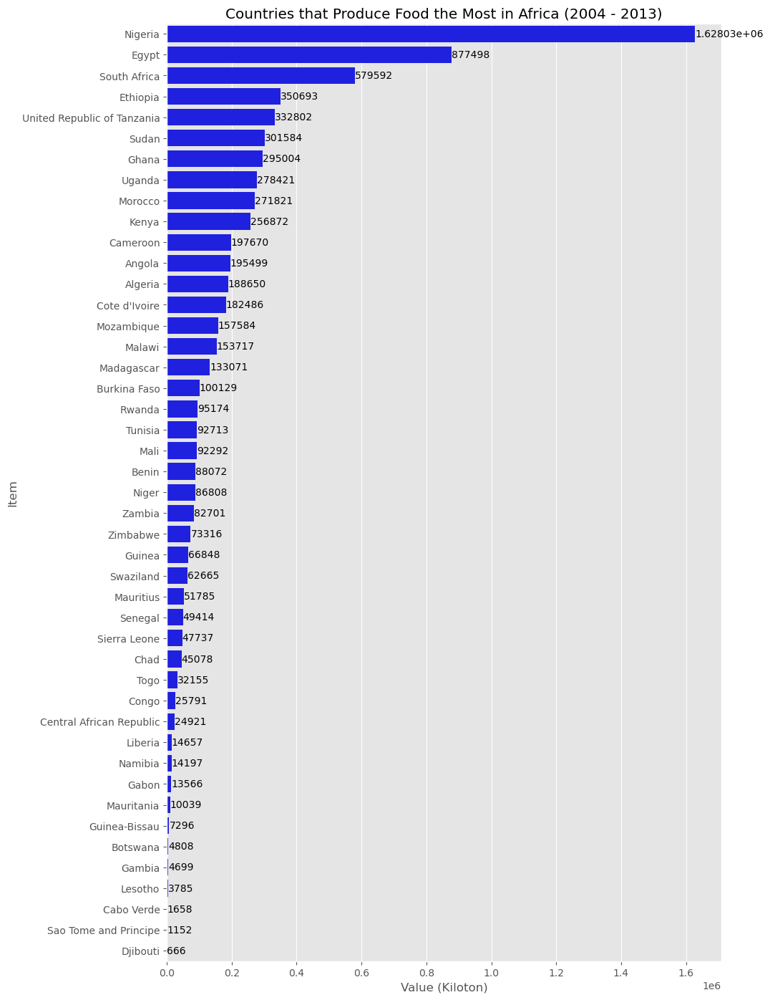

In [18]:
#Visualization
top_producing=pd.DataFrame(food_production.groupby(['Country'])['Value'].sum().sort_values(ascending=False)).reset_index()[:45]

plt.rcParams['figure.figsize'] = (10, 17)

ax = sns.barplot(y = top_producing.Country, x = top_producing.Value, data = top_producing, color='b')

for i in ax.containers:
    ax.bar_label(i)
    
plt.gca().set_title("Countries that Produce Food the Most in Africa (2004 - 2013)")
plt.xlabel('Value (Kiloton)')
plt.ylabel('Item')


plt.rc('font', size=15)
plt.rc('xtick', labelsize=20) 
plt.rc('ytick', labelsize=20)

plt.show();

- Looking at the Table and chart above we see that Nigeria is the Top food producing country in Africa between 2004 to 2013 with a toal food production of 1,628,030 kiloton. followed by Egypt with total of 877,498 kiloton  and South Africa with total of 579,592

- While Cabo Verde, Sao Tome and Principe	and Djibouti were the coutries least food producing country in Africa between 2004 to 2013 witha food production of 1658 kt, 1152 kt, 666kt respectively

### Food item(s) that were produced the most / least

In [19]:
# Table showing the total Value (in kiloton) of food produced
pd.DataFrame(food_production.groupby('Item')['Value'].sum().sort_values(ascending = False))

,Value
Item,
Cassava and products,1118948
Sugar cane,887008
Maize and products,574948
Yams,511523
"Vegetables, Other",410403
...,...
Cloves,249
"Molluscs, Other",214
Pepper,199


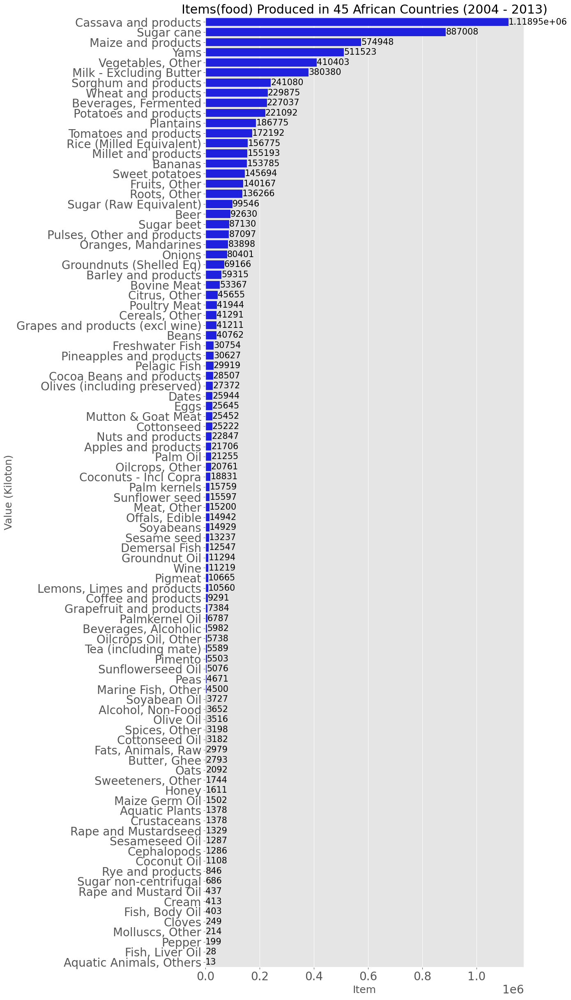

In [20]:
# creating a pandas dataframe with the Item and Value coulmns
food_produced=pd.DataFrame(food_production.groupby('Item')['Value'].sum().sort_values(ascending = False)).reset_index()[:]


plt.rcParams['figure.figsize'] = (10, 30)

ax = sns.barplot(y = food_produced.Item, x = food_produced.Value, data = food_produced, color='b')

for i in ax.containers:
    ax.bar_label(i)
    
plt.gca().set_title("Items(food) Produced in 45 African Countries (2004 - 2013)")
plt.xlabel('Item')
plt.ylabel('Value (Kiloton)')


plt.rc('font', size=15)
plt.rc('xtick', labelsize=20) 
plt.rc('ytick', labelsize=20)

plt.show();

Looking at the chart above we see that Cassava and products is the top most produced food item in Africa from 2004 to 2013 followed by Sugar cane, Maize and products, Yams, Vegetables, Other. 

While the least produced food items are Cloves, Molluscs/Other, Pepper, Fish/Liver Oil, Aquatic Animals/Others.
However, the above chart looks too long, one will have to scroll long, so i will divide it for better understanding (top 25) and (least 25) 

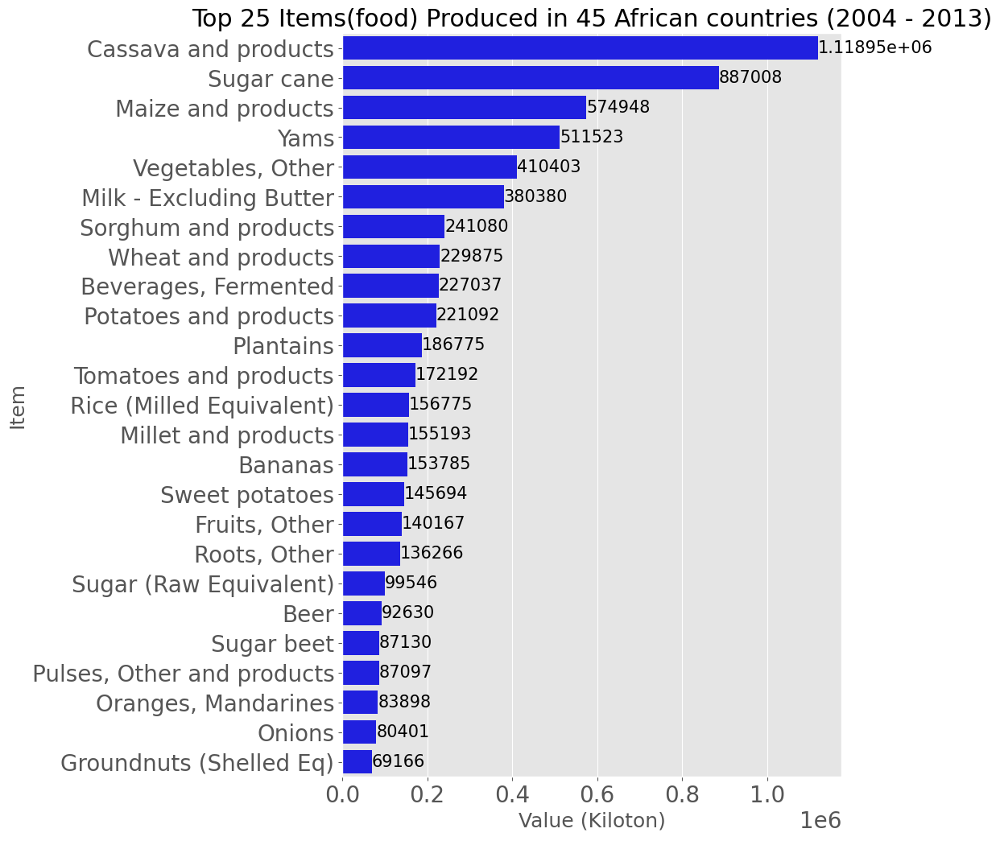

In [21]:
# Visualizing Top 25 food items produced in Africa
top25=pd.DataFrame(food_production.groupby('Item')['Value'].sum().sort_values(ascending = False)).reset_index()[:25]


plt.rcParams['figure.figsize'] = (8, 12)

top = sns.barplot(y = top25.Item, x = top25.Value, data = top25, color='b')

for i in top.containers:
    top.bar_label(i)
    
plt.gca().set_title("Top 25 Items(food) Produced in 45 African countries (2004 - 2013)")
plt.xlabel('Value (Kiloton)')
plt.ylabel('Item')


plt.rc('font', size=10)
plt.rc('xtick', labelsize=12) 
plt.rc('ytick', labelsize=12)

plt.show();

Just as seen above Cassava and products is the top most produced food item in Africa from 2004 to 2013 having a total 1,118,948 kiloton followed by Sugar cane with a total of 887,008 kiloton Maize and products with 574,948 kiloton. Knowning this i also want to know which country produced the top 3 food items more which we will see in the later part

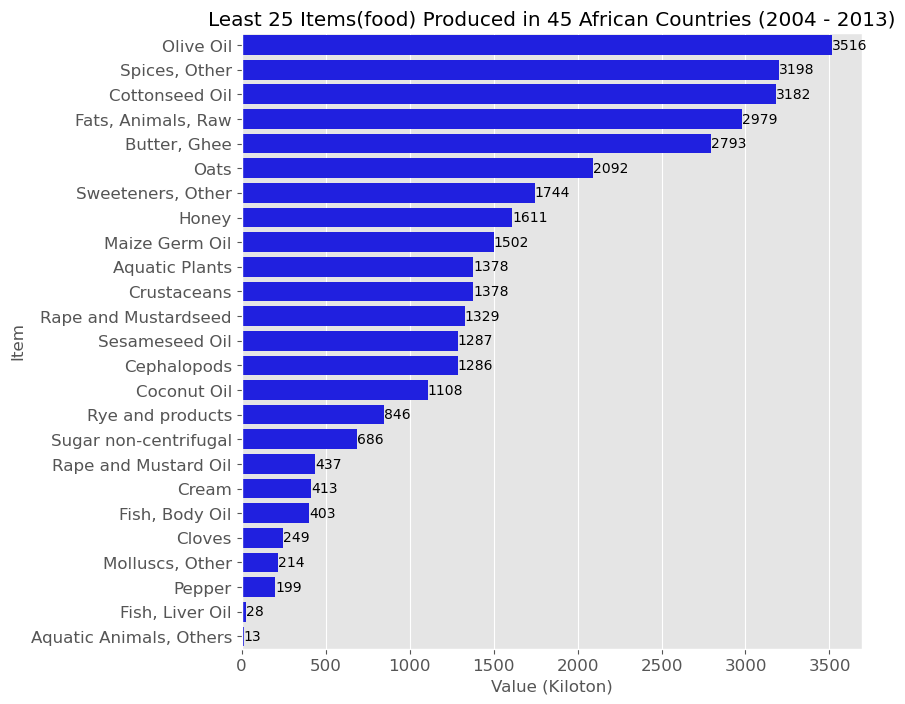

In [22]:
# Visualizing Least 25 food items produced in Africa
least25=pd.DataFrame(food_production.groupby('Item')['Value'].sum().sort_values(ascending = False)).reset_index()[69:]

plt.rcParams['figure.figsize'] = (8, 8)

least = sns.barplot(y = least25.Item, x = least25.Value, data = least25, color='b')

for i in least.containers:
    least.bar_label(i)
    
plt.gca().set_title("Least 25 Items(food) Produced in 45 African Countries (2004 - 2013)")
plt.xlabel('Value (Kiloton)')
plt.ylabel('Item')


plt.rc('font', size=10)
plt.rc('xtick', labelsize=15) 
plt.rc('ytick', labelsize=15)
plt.show();

The least produced food items are Cloves, Molluscs/Other, Pepper, Fish/Liver Oil, Aquatic Animals/Others. 

### What Food Did Nigeria Produce more from 2004 to 2013

With Nigeria being the top producing country for the period , i want to know the food they produced more/least

In [23]:
#filtering only Nigeia food production data
nigeria = food_production[food_production.Country == 'Nigeria']
nigeria

,Country,Item,Year,Value,Unit
15380,Nigeria,Wheat and products,2004,62,kt
15381,Nigeria,Wheat and products,2005,66,kt
15382,Nigeria,Wheat and products,2006,71,kt
15383,Nigeria,Wheat and products,2007,44,kt
15384,Nigeria,Wheat and products,2008,53,kt
...,...,...,...,...,...
15985,Nigeria,"Molluscs, Other",2009,3,kt
15986,Nigeria,"Molluscs, Other",2010,3,kt
15987,Nigeria,"Molluscs, Other",2011,4,kt
15988,Nigeria,"Molluscs, Other",2012,4,kt


In [24]:
# Nigeria top produced food from 2004 to 2013
nigeria_products=pd.DataFrame(nigeria.groupby(['Country', "Item"])['Value'].sum().sort_values(ascending=False))
nigeria_products

Value
Country Item                        
Nigeria Cassava and products  452881
        Yams                  349519
        Beverages, Fermented   93839
        Vegetables, Other      83335
        Sorghum and products   78915
...                              ...
        Sesameseed Oil            35
        Coffee and products       33
        Soyabean Oil              32
        Molluscs, Other           32
        Cephalopods                0

[61 rows x 1 columns]

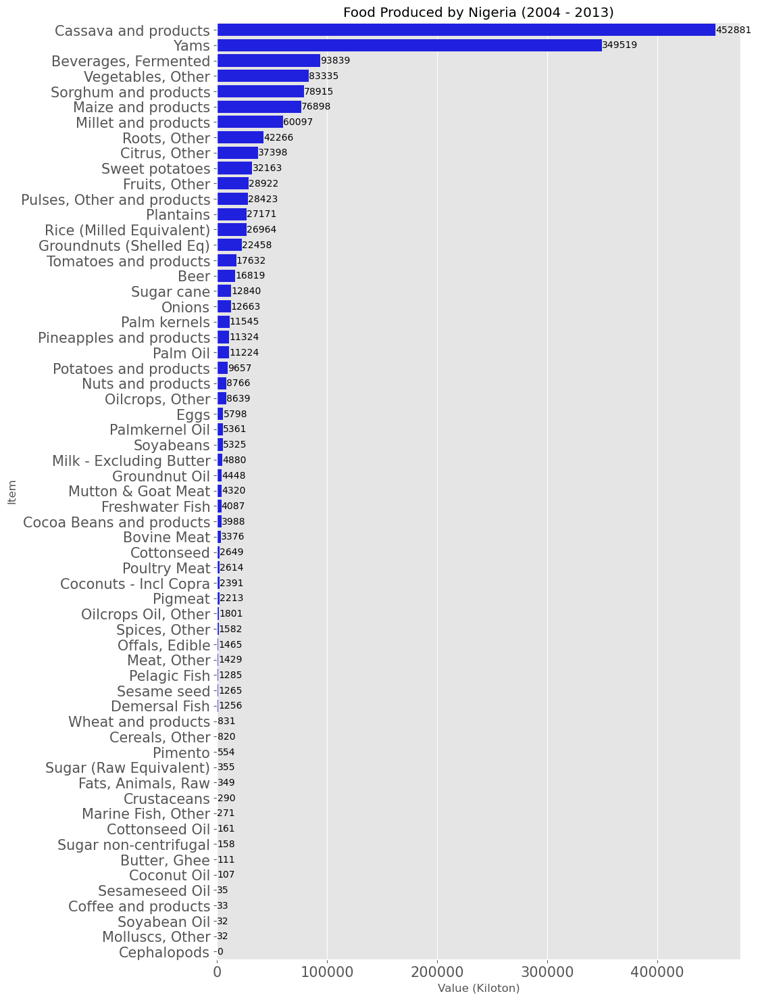

In [25]:
#visualizing Nigeria top produced food from 2004 to 2013

nigeria_products=pd.DataFrame(nigeria.groupby(['Country', "Item"])['Value'].sum().sort_values(ascending=False)).reset_index()[:]

plt.rcParams['figure.figsize'] = (10, 18)

niaja = sns.barplot(y = nigeria_products.Item, x = nigeria_products.Value, data = nigeria_products, color='b')

for i in niaja.containers:
    niaja.bar_label(i)
    
plt.gca().set_title("Food Produced by Nigeria (2004 - 2013)")
plt.xlabel('Value (Kiloton)')
plt.ylabel('Item')


plt.rc('font', size=10)
plt.rc('xtick', labelsize=12) 
plt.rc('ytick', labelsize=12)

plt.show();

We can see that Cassava and products is the top food prodcued in Nigeria from 2004 to 2013 with a total of 452,881 kiloton followed by Yam with total of 349,519 kiloton,  while Beverages, Fermented produced is 93,839 kiloton. Other products can be seen in the above chart.

If we look at this analysis well we can see decline in other food production in Nigeria

### What Food Did Egypt Produce more from 2004 to 2013

With Egypt being the 2nd top producing country for the period , i also want to know the food they produced more/least

In [27]:
#filtering only Egypt food production data
egypt = food_production[food_production.Country == 'Egypt']
egypt

,Country,Item,Year,Value,Unit
5660,Egypt,Wheat and products,2004,7178,kt
5661,Egypt,Wheat and products,2005,8141,kt
5662,Egypt,Wheat and products,2006,8274,kt
5663,Egypt,Wheat and products,2007,7379,kt
5664,Egypt,Wheat and products,2008,7977,kt
...,...,...,...,...,...
6355,Egypt,Aquatic Plants,2009,0,kt
6356,Egypt,Aquatic Plants,2010,0,kt
6357,Egypt,Aquatic Plants,2011,0,kt
6358,Egypt,Aquatic Plants,2012,0,kt


In [28]:
# Nigeria top produced food from 2004 to 2013
egypt_products=pd.DataFrame(egypt.groupby(['Country', "Item"])['Value'].sum().sort_values(ascending=False))
egypt_products

Value
Country Item                           
Egypt   Sugar cane               160973
        Tomatoes and products     85505
        Vegetables, Other         85271
        Wheat and products        81311
        Maize and products        70993
...                                 ...
        Pigmeat                      13
        Peas                          1
        Aquatic Plants                0
        Aquatic Animals, Others       0
        Fish, Body Oil                0

[70 rows x 1 columns]

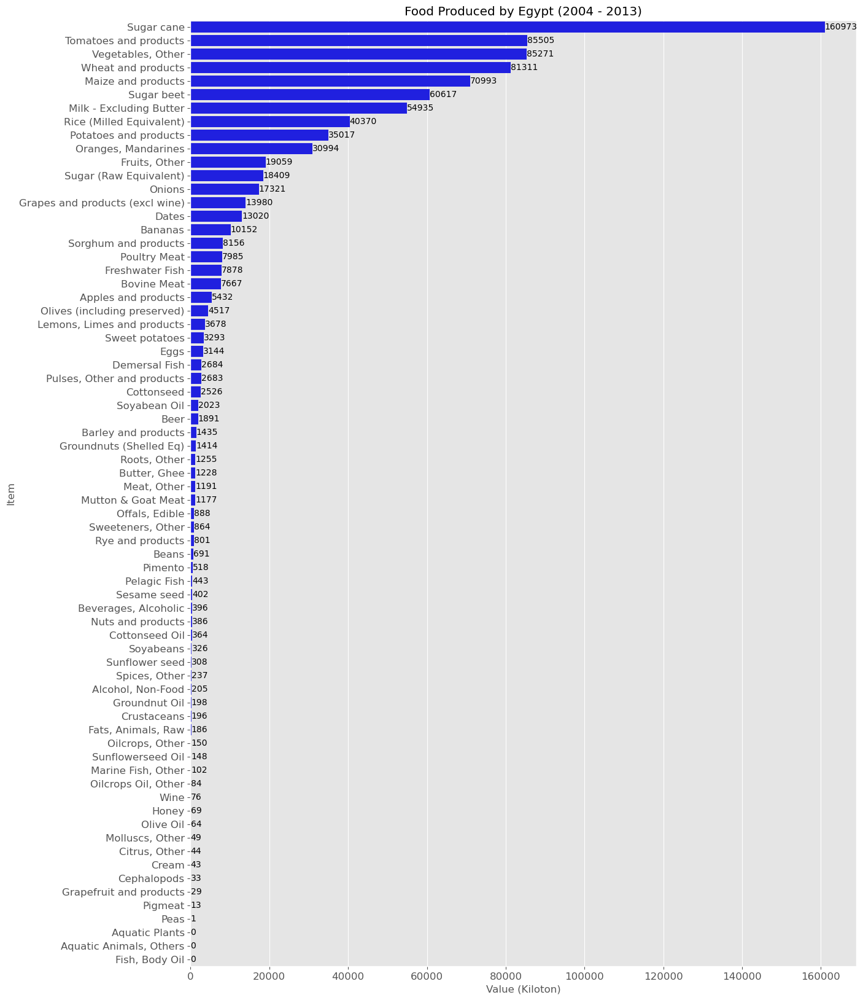

In [29]:
#visualizing Egypt top produced food from 2004 to 2013
egypt_products=pd.DataFrame(egypt.groupby(['Country', "Item"])['Value'].sum().sort_values(ascending=False)).reset_index()[:]

plt.rcParams['figure.figsize'] = (14, 20)

egy = sns.barplot(y = egypt_products.Item, x = egypt_products.Value, data = egypt_products, color='b')

for i in egy.containers:
    egy.bar_label(i)
    
plt.gca().set_title("Food Produced by Egypt (2004 - 2013)")
plt.xlabel('Value (Kiloton)')
plt.ylabel('Item')


plt.rc('font', size=10)
plt.rc('xtick', labelsize=12) 
plt.rc('ytick', labelsize=12)

plt.show();

From the above table we can see that Sugar cane is the top food prodcued in Egypt from 2004 to 2013 with a total of 160,973 kiloton followed by Tomatoes and products with total of 85,505 kiloton, while Vegetables, Other is 85,271 kiloton. other products can be seen in the table above

### What Food Did South Africa Produce more from 2004 to 2013

With South Africa being the 3rd top producing country for the period , i want to know the food they produced more/least

In [30]:
#filtering only South Africa food production data
southafrica = food_production[food_production.Country == 'South Africa']
southafrica

,Country,Item,Year,Value,Unit
17760,South Africa,Wheat and products,2004,1687,kt
17761,South Africa,Wheat and products,2005,1905,kt
17762,South Africa,Wheat and products,2006,2105,kt
17763,South Africa,Wheat and products,2007,1905,kt
17764,South Africa,Wheat and products,2008,2130,kt
...,...,...,...,...,...
18505,South Africa,Aquatic Plants,2009,13,kt
18506,South Africa,Aquatic Plants,2010,14,kt
18507,South Africa,Aquatic Plants,2011,14,kt
18508,South Africa,Aquatic Plants,2012,18,kt


In [31]:
# Nigeria top produced food from 2004 to 2013
southafrica_products=pd.DataFrame(southafrica.groupby(['Country', "Item"])['Value'].sum().sort_values(ascending=False))
southafrica_products

Value
Country      Item                           
South Africa Sugar cane               188396
             Maize and products       107343
             Milk - Excluding Butter   30965
             Beer                      27127
             Sugar (Raw Equivalent)    22269
...                                      ...
             Honey                        10
             Sesameseed Oil                9
             Coconut Oil                   4
             Fish, Liver Oil               2
             Aquatic Animals, Others       0

[75 rows x 1 columns]

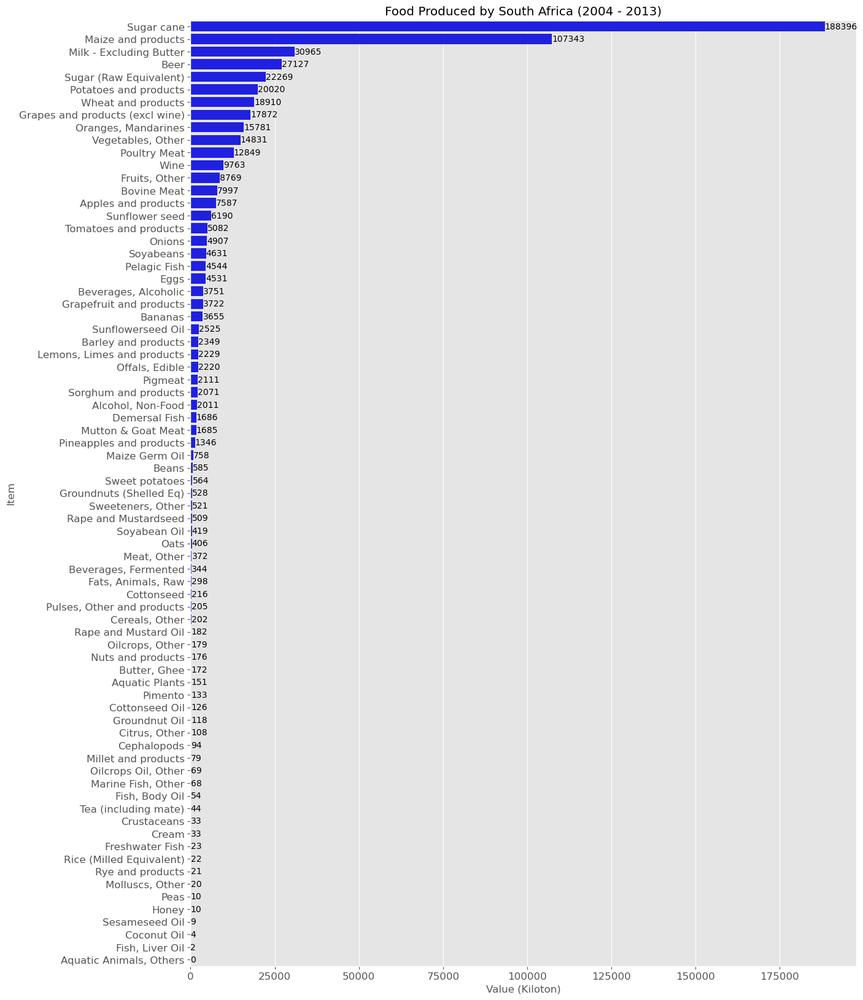

In [32]:
#visualizing South Africa top produced food from 2004 to 2013
southafrica_products=pd.DataFrame(southafrica.groupby(['Country', "Item"])['Value'].sum().sort_values(ascending=False)).reset_index()[:]

plt.rcParams['figure.figsize'] = (14, 20)

sa = sns.barplot(y = southafrica_products.Item, x = southafrica_products.Value, data = southafrica_products, color='b')

for i in sa.containers:
    sa.bar_label(i)
    
plt.gca().set_title("Food Produced by South Africa (2004 - 2013)")
plt.xlabel('Value (Kiloton)')
plt.ylabel('Item')


plt.rc('font', size=10)
plt.rc('xtick', labelsize=12) 
plt.rc('ytick', labelsize=12)

plt.show();

- Sugarcane is the most produced food in South Africa from 2004 to 2013 with a total of 188,396 kiloton, followed by Maize and products	with total 107,343 kiloton, Milk - Excluding Butter	30965 kiloton, other food items produced by South Africa can be seen in the above table.


- Sugarcane been the 2nd most produced food in 45 African countries from 2004 to 2013. We can see that its the top most produced food by South Africa surprisingly it’s  also the top produced food in Egypt. In the next part we will visualize to see the overall sugarcane producing country

### Who are the Top Cassava, Sugar cane, Maize and products producing countries?

#### Top Sugar Cane producing countries

In [33]:
# Filtering the Cassava production data
sugarcane_production = food_production[food_production.Item == 'Sugar cane']
sugarcane_production

,Country,Item,Year,Value,Unit
660,Angola,Sugar cane,2004,345,kt
661,Angola,Sugar cane,2005,345,kt
662,Angola,Sugar cane,2006,450,kt
663,Angola,Sugar cane,2007,500,kt
664,Angola,Sugar cane,2008,520,kt
...,...,...,...,...,...
22595,Zimbabwe,Sugar cane,2009,2338,kt
22596,Zimbabwe,Sugar cane,2010,2692,kt
22597,Zimbabwe,Sugar cane,2011,3058,kt
22598,Zimbabwe,Sugar cane,2012,3929,kt


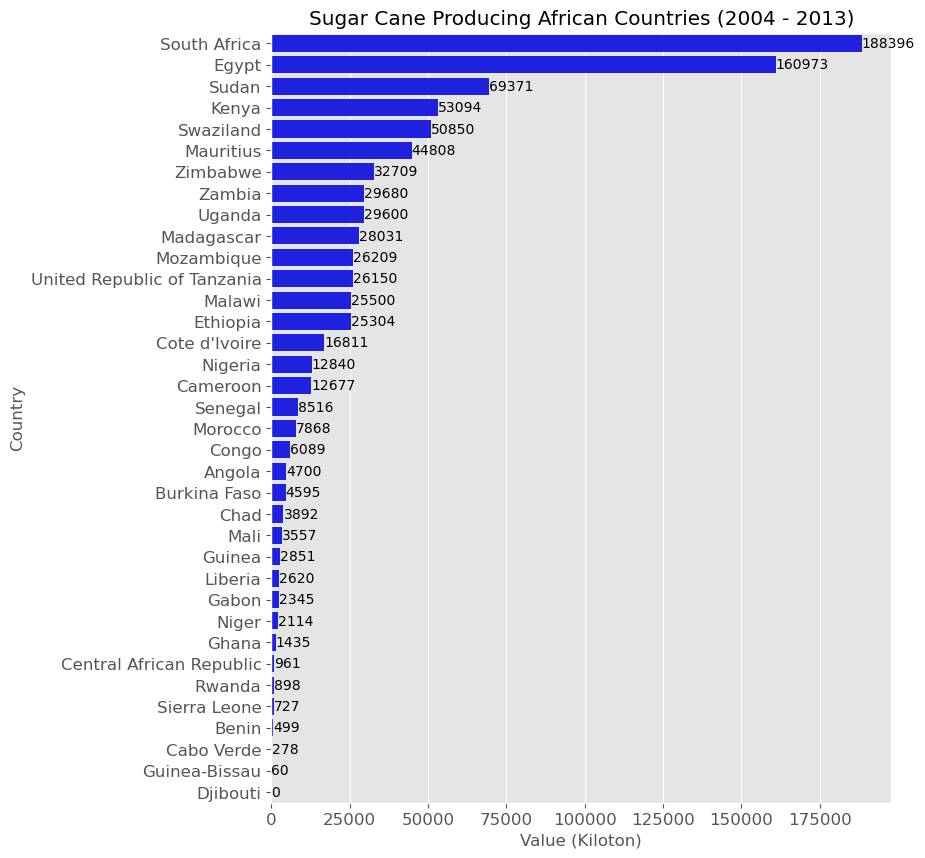

In [34]:
# Chart to display top cassava producing countries
# plt.style.use("ggplot")

plt.rcParams['figure.figsize'] = (8, 10)


top_sugarcane = pd.DataFrame(sugarcane_production.groupby(['Country'])['Value'].sum().sort_values(ascending=False)).reset_index()


sugar = sns.barplot(y = top_sugarcane.Country, x = top_sugarcane.Value, data = top_sugarcane, color='b')

for i in sugar.containers:
    sugar.bar_label(i)

plt.gca().set_title("Sugar Cane Producing African Countries (2004 - 2013)")
plt.xlabel('Value (Kiloton)')
plt.ylabel('Country')


plt.rc('font', size=10)
plt.rc('xtick', labelsize=10) 
plt.rc('ytick', labelsize=10)
plt.show();



We can now conclusively say that South Africa is the top sugarcane producing country from 2004 to 2013 with a total production of 188,396 kiloton follwed by Egypt with total of 160,973 kiloton and Sudan with 69,371 kiloton. Other number of sugarcane production by other countries can be seen in the chart above

#### Top Cassava producing countries

In [35]:
# Filtering the Cassava production data
cassava_production = food_production[food_production.Item == 'Cassava and products']
cassava_production

,Country,Item,Year,Value,Unit
630,Angola,Cassava and products,2004,8587,kt
631,Angola,Cassava and products,2005,8806,kt
632,Angola,Cassava and products,2006,9037,kt
633,Angola,Cassava and products,2007,9730,kt
634,Angola,Cassava and products,2008,10057,kt
...,...,...,...,...,...
22555,Zimbabwe,Cassava and products,2009,216,kt
22556,Zimbabwe,Cassava and products,2010,204,kt
22557,Zimbabwe,Cassava and products,2011,225,kt
22558,Zimbabwe,Cassava and products,2012,228,kt


In [36]:
#Table to display the top cassava producing countries
pd.DataFrame(cassava_production.groupby(['Country'])['Value'].sum().sort_values(ascending=False))

,Value
Country,
Nigeria,452881
Ghana,121026
Angola,114286
Mozambique,71243
United Republic of Tanzania,52057
Uganda,38317
Malawi,35881
Cameroon,32904
Benin,32458


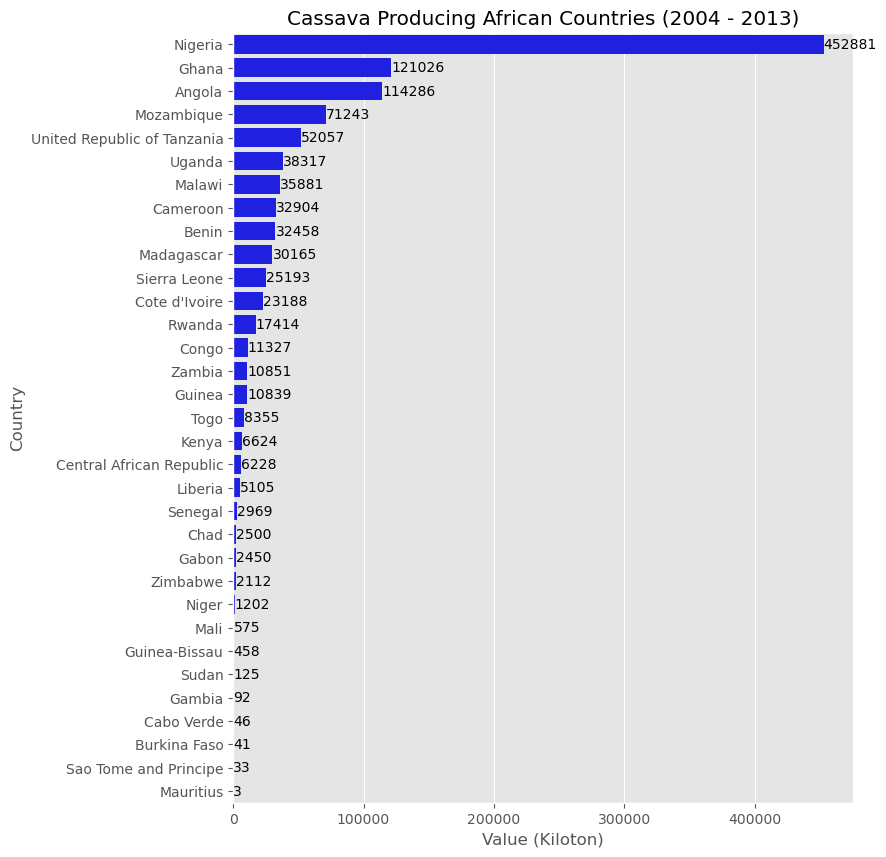

In [37]:
# Chart to display top cassava producing countries

plt.rcParams['figure.figsize'] = (8, 10)


top_cassava = pd.DataFrame(cassava_production.groupby(['Country'])['Value'].sum().sort_values(ascending=False)).reset_index()


cas = sns.barplot(y = top_cassava.Country, x = top_cassava.Value, data = top_cassava, color='b')

for i in cas.containers:
    cas.bar_label(i)

plt.gca().set_title("Cassava Producing African Countries (2004 - 2013)")
plt.xlabel('Value (Kiloton)')
plt.ylabel('Country')


plt.rc('font', size=10)
plt.rc('xtick', labelsize=10) 
plt.rc('ytick', labelsize=10)
plt.show();



- Nigeria is the top cassava producing country with a total of 452,881 kiloton followed by Ghana with total cassava production of 121,026 and Angola with 121,026.
- With Nigeria been the overall top producing country from 2004 - 2013 its no surprise seeing the large Margin differnce between the casava production value of Nigeria and other countries

#### Top Maize and products producing countries

In [38]:
# get the Cassava production data
maize_production = food_production[food_production.Item == 'Maize and products']
maize_production

,Country,Item,Year,Value,Unit
30,Algeria,Maize and products,2004,1,kt
31,Algeria,Maize and products,2005,1,kt
32,Algeria,Maize and products,2006,2,kt
33,Algeria,Maize and products,2007,2,kt
34,Algeria,Maize and products,2008,1,kt
...,...,...,...,...,...
22505,Zimbabwe,Maize and products,2009,700,kt
22506,Zimbabwe,Maize and products,2010,1192,kt
22507,Zimbabwe,Maize and products,2011,1452,kt
22508,Zimbabwe,Maize and products,2012,968,kt


In [39]:
#Table to display the top Maize producing countries
pd.DataFrame(maize_production.groupby(['Country'])['Value'].sum().sort_values(ascending=False))

,Value
Country,
South Africa,107343
Nigeria,76898
Egypt,70993
Ethiopia,45745
United Republic of Tanzania,43166
Kenya,30328
Malawi,29265
Uganda,19914
Zambia,19170


South Africa is the top Maize producing country from 2004 to 2013 havina a total production of 107,343 kt followed by Nigeria	with total of 76,898 kt, Egypt	70,993 kt. Other countries values can be seen in the above table.

Finnally, we can also say that the top 3 produced food were produced by the top 3 food producing country (Nigeria, Egypt and South Africa)

### Top Rice producing countries
In the later part of the project i will be working with rice production. Rice been one of the popular food in Nigeria, i'm curous to know the top rice producing country. 

In [40]:
# Filter the Rice production data
rice_producing_countries = food_production[food_production.Item == 'Rice (Milled Equivalent)']
rice_producing_countries

,Country,Item,Year,Value,Unit
10,Algeria,Rice (Milled Equivalent),2004,0,kt
11,Algeria,Rice (Milled Equivalent),2005,0,kt
12,Algeria,Rice (Milled Equivalent),2006,0,kt
13,Algeria,Rice (Milled Equivalent),2007,0,kt
14,Algeria,Rice (Milled Equivalent),2008,0,kt
...,...,...,...,...,...
22485,Zimbabwe,Rice (Milled Equivalent),2009,0,kt
22486,Zimbabwe,Rice (Milled Equivalent),2010,0,kt
22487,Zimbabwe,Rice (Milled Equivalent),2011,0,kt
22488,Zimbabwe,Rice (Milled Equivalent),2012,0,kt


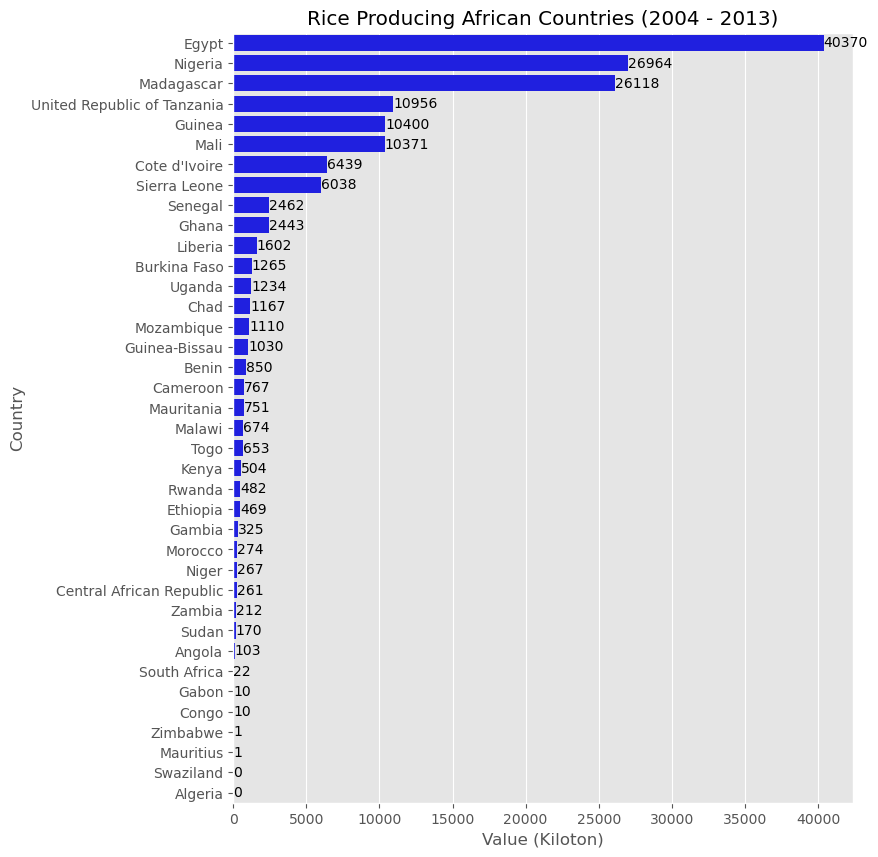

In [41]:
# Chart to display top rice producing countries

plt.rcParams['figure.figsize'] = (8, 10)


top_rice= pd.DataFrame(rice_producing_countries.groupby(['Country'])['Value'].sum().sort_values(ascending=False)).reset_index()


rice = sns.barplot(y = top_rice.Country, x = top_rice.Value, data = top_rice, color='b')

for i in rice.containers:
    rice.bar_label(i)

plt.gca().set_title("Rice Producing African Countries (2004 - 2013)")
plt.xlabel('Value (Kiloton)')
plt.ylabel('Country')


plt.rc('font', size=10)
plt.rc('xtick', labelsize=10) 
plt.rc('ytick', labelsize=10)
plt.show();



Surprisingly from 2004 to 2013 Egypt is the top rice producing country having a total production of 40,370 kiloton followed by Nigeria with 26,964 kiloton and Madagascar with 26,118 kiloton.

### Did Food production in Africa from 2004 to 2013 Decrease or Increase?

In [42]:
# Table showing the food production in Africa from 2004 to 2013
production_trend=pd.DataFrame(food_production.groupby(['Year'])['Value'].sum())
production_trend

,Value
Year,
2004,663006
2005,691257
2006,718602
2007,705659
2008,736804
2009,746870
2010,786466
2011,812214
2012,841667


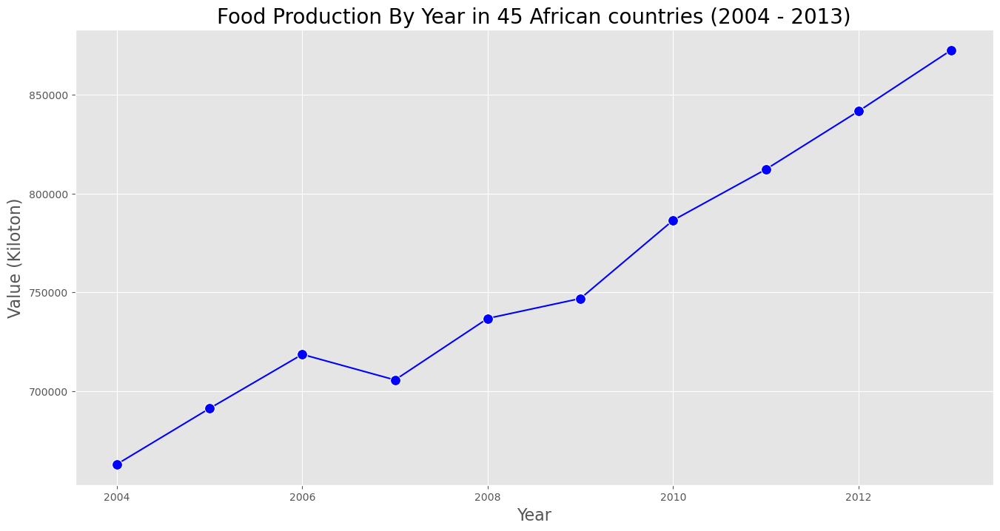

In [43]:
# using line series to show the food production trend
plt.figure(figsize=[16,8])


sns.lineplot(data=production_trend, x="Year", y="Value", marker='o', markersize=10, ci=None, color='b')
plt.title("Food Production By Year in 45 African countries (2004 - 2013)", fontsize=20);
plt.xlabel('Year', fontsize=16)
plt.ylabel('Value (Kiloton)', fontsize=16);
plt.rc('xtick', labelsize=15) 
plt.rc('ytick', labelsize=15)

Insight from the above chart shows that food production in Africa increased by the year. However, there was a slight decrease in 2007 and increase afterwards till 2013.

In [44]:
# Map visualization to show  the food production from 2004 to 2013
map = px.choropleth(
            locations = food_production['Country'],
            locationmode = 'country names',
            hover_name= food_production['Country'],
            color=food_production['Value'],
            color_continuous_scale=px.colors.sequential.Viridis,
            animation_frame= food_production['Year'],
            
)
map.update_layout(title_text = 'Food Production in 45 African countries (2004-2013)')
map

### Checking For Outlier

In [45]:
food_production.describe()

,Year,Value
count,23110.000000,23110.000000
mean,2008.498269,327.785201
std,2.871740,1607.940343
min,2004.000000,0.000000
25%,2006.000000,3.000000
50%,2008.000000,18.000000
75%,2011.000000,108.000000
max,2013.000000,54000.000000


In [46]:
# Median food production
food_production.median()

Year     2008.0
Value      18.0
dtype: float64

In [47]:
# Average food production
food_production.mean()

Year     2008.498269
Value     327.785201
dtype: float64

In [48]:
# food production 75% quratile value for each year
fp_q3 = food_production.quantile(0.75)
fp_q3

Year     2011.0
Value     108.0
Name: 0.75, dtype: float64

In [49]:
# getting the 50% quratile food production value for each year
fp_q2 = food_production.quantile(0.50)
fp_q2

Year     2008.0
Value      18.0
Name: 0.5, dtype: float64

In [50]:
# getting the 25% quratile food production value for each year
fp_q1 = food_production.quantile(0.25)
fp_q1

Year     2006.0
Value       3.0
Name: 0.25, dtype: float64

In [51]:
# To get our (IQR) interquatile range
fp_q3 = 108.0
fp_q2 = 3.0
fp_q1 = 3.0

fp_IQR = fp_q3 - fp_q1
fp_IQR

105.0

In [52]:
# To get the lower fence value
fp_lower_fence = fp_q1 -( 1.5 * fp_IQR)
fp_lower_fence

-154.5

In [53]:
# getting the upper fence value
fp_upper_fence = fp_q3 + ( 1.5 * fp_IQR)
fp_upper_fence

265.5

- Note: Any value that falls below the lower fence or above the upper fence is considered an outlier.

In [54]:
# Display the data whose value is lower than the lower fence
food_production[food_production.Value < (fp_q1 - (1.5 * fp_IQR))]

,Country,Item,Year,Value,Unit


In [55]:
# try to display the data whose value is higher than the upper fence
food_production[food_production.Value > (fp_q1 + (1.5 * fp_IQR))]

,Country,Item,Year,Value,Unit
0,Algeria,Wheat and products,2004,2731,kt
1,Algeria,Wheat and products,2005,2415,kt
2,Algeria,Wheat and products,2006,2688,kt
3,Algeria,Wheat and products,2007,2319,kt
4,Algeria,Wheat and products,2008,1111,kt
...,...,...,...,...,...
23085,Zimbabwe,Milk - Excluding Butter,2009,389,kt
23086,Zimbabwe,Milk - Excluding Butter,2010,396,kt
23087,Zimbabwe,Milk - Excluding Butter,2011,400,kt
23088,Zimbabwe,Milk - Excluding Butter,2012,410,kt


### Checking for outliers in Years

In [56]:
# Looking for outliers in years
outlier_year = pd.DataFrame(food_production[food_production.Value > (fp_q1 + (1.5 * fp_IQR))])

In [57]:
# checking the number of years that are outliers
outlier_year['Year'].nunique()

10

This shows that the 10 years are outliers. Meaning each year food production kept increasing

In [58]:
# checking the years of the outliers
outlier_year['Year'].unique()

array([2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013],
      dtype=int64)

### Checking for outliers in Countries

In [59]:
# Looking for outliers in countries and saving it to a Data Frame
outlier_countries = pd.DataFrame(food_production[food_production.Value > (fp_q1 + (1.5 * fp_IQR))])

In [60]:
# checking the number of countries that are outliers
outlier_countries['Country'].nunique()

39

We have 39 countries as outliers. But we dont know the names of this countries

In [61]:
# checking the names of the outlier countries
outlier_countries['Country'].unique()

array(['Algeria', 'Angola', 'Benin', 'Burkina Faso', 'Cameroon',
       'Central African Republic', 'Chad', 'Congo', "Cote d'Ivoire",
       'Egypt', 'Ethiopia', 'Gabon', 'Ghana', 'Guinea', 'Guinea-Bissau',
       'Kenya', 'Liberia', 'Madagascar', 'Malawi', 'Mali', 'Mauritania',
       'Mauritius', 'Morocco', 'Mozambique', 'Namibia', 'Niger',
       'Nigeria', 'Rwanda', 'Senegal', 'Sierra Leone', 'South Africa',
       'Sudan', 'Swaziland', 'Togo', 'Tunisia', 'Uganda',
       'United Republic of Tanzania', 'Zambia', 'Zimbabwe'], dtype=object)

This means these 39 countries had more food production than others from 2004 to 2013

In [139]:
# visualizing the outlier countries
px.line(outlier_countries, x = 'Country', y = 'Value', title = 'Outliers Country in Food Production',
        labels = {'Country': 'Country', 'Value':'Value (kiloton)'})


# Importing the Food Supply Data

In [63]:
#Import the food supply data set
food_supply= pd.read_csv(r"C:\Users\chine\Downloads\Raw Data\Africa Food Supply (2004 - 2013).csv")
food_supply

,Country,Year,Value
0,Algeria,2004,2987
1,Algeria,2005,2958
2,Algeria,2006,3047
3,Algeria,2007,3041
4,Algeria,2008,3048
...,...,...,...
445,Zimbabwe,2009,2147
446,Zimbabwe,2010,2168
447,Zimbabwe,2011,2200
448,Zimbabwe,2012,2197


In [64]:
#Checking data types
food_supply.dtypes

Country    object
Year        int64
Value       int64
dtype: object

In [66]:
# Looking at the descriptive statistics of our dataset
food_supply.describe()

,Year,Value
count,450.000000,450.000000
mean,2008.500000,2469.775556
std,2.875478,379.140143
min,2004.000000,1781.000000
25%,2006.000000,2174.000000
50%,2008.500000,2376.000000
75%,2011.000000,2681.750000
max,2013.000000,3561.000000


In [67]:
# checking the number of unique countries in our data
food_supply['Country'].nunique()

45

# Data Cleaning

In [68]:
# Checking for duplicated rows in our dataframe
food_supply.duplicated().sum()

0

In [69]:
# Checking for missing values in our dataset
food_supply.isnull().sum()

Country    0
Year       0
Value      0
dtype: int64

In [70]:
# create a unit column for our value
food_supply['Unit'] = 'kcal/person/day'

In [71]:
# checking if unit column has been added to the data
food_supply

,Country,Year,Value,Unit
0,Algeria,2004,2987,kcal/person/day
1,Algeria,2005,2958,kcal/person/day
2,Algeria,2006,3047,kcal/person/day
3,Algeria,2007,3041,kcal/person/day
4,Algeria,2008,3048,kcal/person/day
...,...,...,...,...
445,Zimbabwe,2009,2147,kcal/person/day
446,Zimbabwe,2010,2168,kcal/person/day
447,Zimbabwe,2011,2200,kcal/person/day
448,Zimbabwe,2012,2197,kcal/person/day


In [72]:
# converting the Year column to datetime
food_supply['Year'] = pd.to_datetime(food_supply['Year'], format="%Y").dt.year

In [73]:
# Group by Country, Year to see the total number of values of item supplied to each country for each year
supply = food_supply.groupby(['Country', 'Year'])
supply.first()

Value             Unit
Country  Year                        
Algeria  2004   2987  kcal/person/day
         2005   2958  kcal/person/day
         2006   3047  kcal/person/day
         2007   3041  kcal/person/day
         2008   3048  kcal/person/day
...              ...              ...
Zimbabwe 2009   2147  kcal/person/day
         2010   2168  kcal/person/day
         2011   2200  kcal/person/day
         2012   2197  kcal/person/day
         2013   2110  kcal/person/day

[450 rows x 2 columns]

### Country that suppied food the most

In [74]:
# visualize the food supply data with plotly(line plot)
plt.figure(figsize=(10,10))
food_supply_plot = px.line(food_supply, x=food_supply['Year'],y=food_supply['Value'],
                          color=food_supply['Country'],
                          title ="Countries that Supply Food the Most in Africa (2004 - 2013)",
                          labels = {'Year': 'Year', 'Value':'Value (kcal/person/day)'})
food_supply_plot.update_layout(yaxis_type='log')
food_supply_plot

<Figure size 1000x1000 with 0 Axes>

The above chart is too clustered. Hence, i will use table and bar chart to make it more readable and easily understood

In [75]:
# Table to show the countries that supplied food the most
pd.DataFrame(food_supply.groupby(['Country'])['Value'].sum().sort_values(ascending=False))

,Value
Country,
Egypt,34580
Tunisia,33055
Morocco,32967
Algeria,31118
Mauritius,30543
South Africa,29629
Ghana,29180
Cote d'Ivoire,27666
Mali,27502


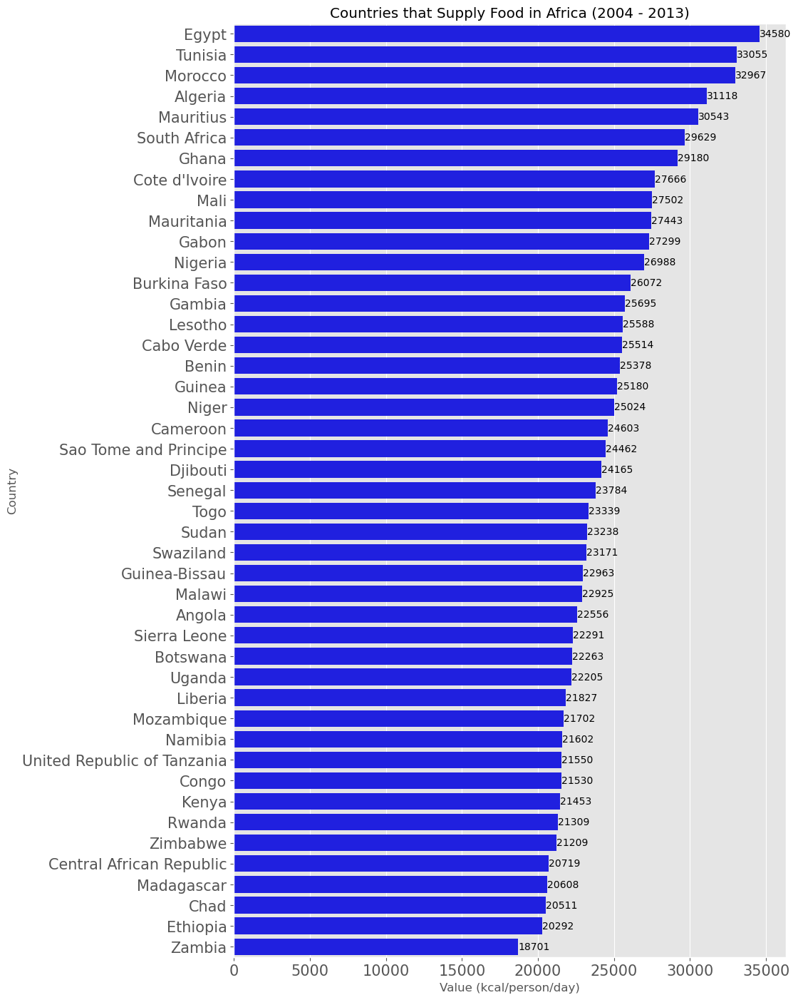

In [76]:
# Visualization to show the country that supplies food the most
top_suppliers=pd.DataFrame(food_supply.groupby(['Country'])['Value'].sum().sort_values(ascending=False)).reset_index()[:45]

plt.rcParams['figure.figsize'] = (10, 17)

sup = sns.barplot(y = top_suppliers.Country, x = top_suppliers.Value, data = top_suppliers, color='b')

for i in sup.containers:
    sup.bar_label(i)
    
plt.gca().set_title("Countries that Supply Food in Africa (2004 - 2013)")
plt.xlabel('Value (kcal/person/day)')
plt.ylabel("Country")


plt.rc('font', size=15)
plt.rc('xtick', labelsize=10) 
plt.rc('ytick', labelsize=10)

plt.show();

Egypt is the top food supplying country in Africa from 2004 to 2013 followed closely by Tunisia, and Morocco.

In the food production data we saw that Nigeria, Egypt, and South Africa were the top three food producing countries between those years. However SouthAfrica was the 6th supplying country while Nigeria was the 12th supplying country. Lots of factor would have made this so, politics, population etc.

### Did Yearly food supply in Africa from 2004 to 2013 increase or decrease?

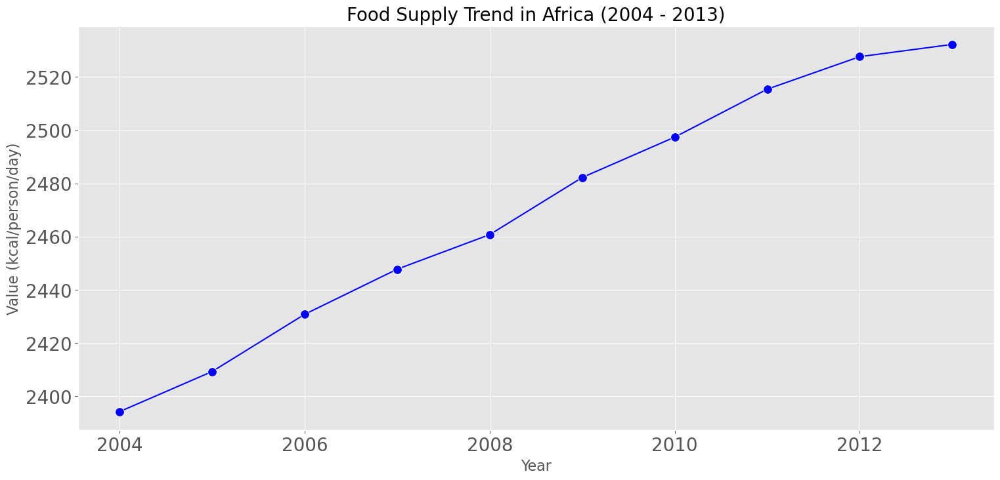

In [77]:
# visualizing the food supply trend over time with line plot
plt.figure(figsize=[18,8])

#set label sizes for axes, xtick and ytick
plt.rc('font', size=15)
plt.rc('xtick', labelsize=20) 
plt.rc('ytick', labelsize=20)

sns.lineplot(data=food_supply, x="Year", y="Value", marker='o', markersize=10, ci=None, color='b')
plt.title("Food Supply Trend in Africa (2004 - 2013)", fontsize=20)
plt.ylabel('Value (kcal/person/day)', fontsize = 16)
plt.xlabel('Year', fontsize=16);

Food supply kept increasing by the year

# Checking For Outliers in Food Supply

In [78]:
# description of our dataset
food_supply.describe()

,Year,Value
count,450.000000,450.000000
mean,2008.500000,2469.775556
std,2.875478,379.140143
min,2004.000000,1781.000000
25%,2006.000000,2174.000000
50%,2008.500000,2376.000000
75%,2011.000000,2681.750000
max,2013.000000,3561.000000


In [79]:
# visualizing food supply data with plotly(box plot)
supply_plot= px.box(data_frame=food_supply,
                             x='Year',
                             y='Value',
                             color='Year',
                             title='Food Supply in 45 African countries (2004 - 2013)',
                             labels = {'Year': 'Year', 'Value':'Value (kcal/person/day)'})
supply_plot.show()

From the boxplot chart above, we can see that there was an outlier in 2012. Looking at the boxplot i cannot tell country that was so i will analyze the data further to verify that
First, lets get the data for 2012:

In [80]:
# getting food supply data for 2012
food_supply_2012 = food_supply[food_supply['Year']==2012]
food_supply_2012

,Country,Year,Value,Unit
8,Algeria,2012,3272,kcal/person/day
18,Angola,2012,2384,kcal/person/day
28,Benin,2012,2610,kcal/person/day
38,Botswana,2012,2342,kcal/person/day
48,Burkina Faso,2012,2707,kcal/person/day
58,Cabo Verde,2012,2590,kcal/person/day
68,Cameroon,2012,2622,kcal/person/day
78,Central African Republic,2012,2116,kcal/person/day
88,Chad,2012,2124,kcal/person/day
98,Congo,2012,2158,kcal/person/day


### Finding statistical measures which will help determine which values in the dataset are outliers:

In [81]:
food_supply.describe()

,Year,Value
count,450.000000,450.000000
mean,2008.500000,2469.775556
std,2.875478,379.140143
min,2004.000000,1781.000000
25%,2006.000000,2174.000000
50%,2008.500000,2376.000000
75%,2011.000000,2681.750000
max,2013.000000,3561.000000


In [82]:
# food supply median value for each year
food_supply.groupby(['Year'])['Value'].median()

Year
2004    2271.0
2005    2311.0
2006    2325.0
2007    2344.0
2008    2439.0
2009    2435.0
2010    2370.0
2011    2407.0
2012    2414.0
2013    2456.0
Name: Value, dtype: float64

In [83]:
# food supply mean value for each year
food_supply.groupby(['Year'])['Value'].mean().round(2)

Year
2004    2394.22
2005    2409.29
2006    2430.80
2007    2447.76
2008    2460.76
2009    2482.22
2010    2497.40
2011    2515.42
2012    2527.64
2013    2532.24
Name: Value, dtype: float64

####  But we have outlier in 2012 lets see the statistical value for 2012 alone

In [84]:
#statistical mesaures of year 2012
pd.DataFrame(food_supply.query('Year==2012')['Value'].describe().round(2))

,Value
count,45.00
mean,2527.64
std,388.47
min,1923.00
25%,2200.00
50%,2414.00
75%,2707.00
max,3561.00


In [85]:
# food supply median value for 2012 alone
food_supply.query('Year==2012')['Value'].median()

2414.0

In [86]:
# food supply mean value for 2012
food_supply.query('Year==2012')['Value'].mean()

2527.6444444444446

#### Getting quartile values

In [87]:
# food supply: 25% quratile (Q1) value for 2012
Q1=food_supply.query('Year==2012')['Value'].quantile(0.25)
Q1

2200.0

In [88]:
# food supply: 75% quratile (Q3) value for 2012
Q3 = food_supply.query('Year==2012')['Value'].quantile(0.75)
Q3

2707.0

In [89]:
# To get the interquatile range (IQR) (Q3 - Q1)
IQR =Q3 -Q1
IQR

507.0

#### Getting Lower Fence and Upper fence

In [90]:
lower_fence = Q1 -( 1.5 * IQR)
lower_fence

1439.5

In [91]:
upper_fence = Q3 + ( 1.5 * IQR)
upper_fence

3467.5

In [92]:
# display the country(s) that is lower than the lower fence
food_supply_2012[food_supply_2012.Value < (Q1 - ( 1.5 * IQR))]


,Country,Year,Value,Unit


No country was below the lower fence

In [93]:
#  display the country(s) that is greater than the upper fence
food_supply_2012[food_supply_2012.Value > (Q1 + ( 1.5 * IQR))].sort_values(by=['Value'], ascending=False)

,Country,Year,Value,Unit
128,Egypt,2012,3561,kcal/person/day
408,Tunisia,2012,3390,kcal/person/day
278,Morocco,2012,3366,kcal/person/day
8,Algeria,2012,3272,kcal/person/day
168,Ghana,2012,3043,kcal/person/day
268,Mauritius,2012,3014,kcal/person/day
368,South Africa,2012,3014,kcal/person/day


- The lower fence is 1439.5 while the upper fence is 3467.5
- Note: Any value that falls below the lower fence or above the upper fence is considered an outlier.

From the above table we can see that Egypt is the outlier because it's value is higher than the upper fence value.

In [94]:
# visualization of 2012 food supply (to also see the outlier)
px.line(food_supply_2012, x = 'Country', y = 'Value', color ='Year', title = 'Food Supply 2012',
        labels = {'Country': 'Country', 'Value':'Value (kcal/person/day)'})

Conclusively, we see that Egypt is above the upper fence, therefore, it’s an outlier. So we can conclude that in 2012, Egypt had significantly higher food available for consumption than other African countries.

# Use and Test of Hypothesis

A hypothesis is an explanation to a question you may have about an observation, an event or a problem. Hypotheses are unproven but they can be tested.

Also, the aim is not to prove that a hypothesis is correct, but to think logically, make a prediction and test it, in order to learn more.

Rice is a carbohydrate food eaten in most parts of the world. It plays a major role in feeding the world. In fact, rice was the third most produced food worldwide in 2014, according to the FAO.

##### In this project we will be Using the Pearson Correlation Test. to determine if rice production in Africa, as a continent, increase as its population rises? In other words, is there a correlation between the amount of rice produced in the whole of Africa (in kt) and its population?

## Getting Population DataSet

I got the population data from the World Bank Open Data Portal. The Open Data site is designed to make World Bank data easy to find, download, and use.

In [95]:
# Reading the population data
population= pd.read_csv(r"C:\Users\chine\Downloads\Raw Data\World Bank Data.csv", skiprows=[0,1,2,3])
population

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,Unnamed: 67
0,Aruba,ABW,"Population, total",SP.POP.TOTL,54608.0,55811.0,56682.0,57475.0,58178.0,58782.0,...,103594.0,104257.0,104874.0,105439.0,105962.0,106442.0,106585.0,106537.0,106445.0,NaN
1,Africa Eastern and Southern,AFE,"Population, total",SP.POP.TOTL,130692579.0,134169237.0,137835590.0,141630546.0,145605995.0,149742351.0,...,583651101.0,600008424.0,616377605.0,632746570.0,649757148.0,667242986.0,685112979.0,702977106.0,720839314.0,NaN
2,Afghanistan,AFG,"Population, total",SP.POP.TOTL,8622466.0,8790140.0,8969047.0,9157465.0,9355514.0,9565147.0,...,32716210.0,33753499.0,34636207.0,35643418.0,36686784.0,37769499.0,38972230.0,40099462.0,41128771.0,NaN
3,Africa Western and Central,AFW,"Population, total",SP.POP.TOTL,97256290.0,99314028.0,101445032.0,103667517.0,105959979.0,108336203.0,...,397855507.0,408690375.0,419778384.0,431138704.0,442646825.0,454306063.0,466189102.0,478185907.0,490330870.0,NaN
4,Angola,AGO,"Population, total",SP.POP.TOTL,5357195.0,5441333.0,5521400.0,5599827.0,5673199.0,5736582.0,...,27128337.0,28127721.0,29154746.0,30208628.0,31273533.0,32353588.0,33428486.0,34503774.0,35588987.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,Kosovo,XKX,"Population, total",SP.POP.TOTL,947000.0,966000.0,994000.0,1022000.0,1050000.0,1078000.0,...,1812771.0,1788196.0,1777557.0,1791003.0,1797085.0,1788878.0,1790133.0,1786038.0,1761985.0,NaN
262,"Yemen, Rep.",YEM,"Population, total",SP.POP.TOTL,5542459.0,5646668.0,5753386.0,5860197.0,5973803.0,6097298.0,...,27753304.0,28516545.0,29274002.0,30034389.0,30790513.0,31546691.0,32284046.0,32981641.0,33696614.0,NaN
263,South Africa,ZAF,"Population, total",SP.POP.TOTL,16520441.0,16989464.0,17503133.0,18042215.0,18603097.0,19187194.0,...,54729551.0,55876504.0,56422274.0,56641209.0,57339635.0,58087055.0,58801927.0,59392255.0,59893885.0,NaN
264,Zambia,ZMB,"Population, total",SP.POP.TOTL,3119430.0,3219451.0,3323427.0,3431381.0,3542764.0,3658024.0,...,15737793.0,16248230.0,16767761.0,17298054.0,17835893.0,18380477.0,18927715.0,19473125.0,20017675.0,NaN


Looking at the population Dataset we have world population from 1960 to 2022. However, the production and supply data is from 2004 to 2013. Hence we are going to remove the unwanted columns.

In [96]:
# Deleting unwanted columns
population.drop(['Country Code', 'Indicator Name', 'Indicator Code',
       '1960', '1961', '1962', '1963', '1964', '1965', '1966', '1967', '1968',
       '1969', '1970', '1971', '1972', '1973', '1974', '1975', '1976', '1977',
       '1978', '1979', '1980', '1981', '1982', '1983', '1984', '1985', '1986',
       '1987', '1988', '1989', '1990', '1991', '1992', '1993', '1994', '1995',
       '1996', '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2014',
       '2015', '2016', '2017', '2018', '2019', '2020', '2021','2022','Unnamed: 67'], axis=1, inplace=True)
    
population

,Country Name,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
0,Aruba,93540.0,94483.0,95606.0,96787.0,97996.0,99212.0,100341.0,101288.0,102112.0,102880.0
1,Africa Eastern and Southern,445281555.0,457153837.0,469508516.0,482406426.0,495748900.0,509410477.0,523459657.0,537792950.0,552530654.0,567892149.0
2,Afghanistan,23553551.0,24411191.0,25442944.0,25903301.0,26427199.0,27385307.0,28189672.0,29249157.0,30466479.0,31541209.0
3,Africa Western and Central,301265247.0,309824829.0,318601484.0,327612838.0,336893835.0,346475221.0,356337762.0,366489204.0,376797999.0,387204553.0
4,Angola,18771125.0,19450959.0,20162340.0,20909684.0,21691522.0,22507674.0,23364185.0,24259111.0,25188292.0,26147002.0
...,...,...,...,...,...,...,...,...,...,...,...
261,Kosovo,1704622.0,1705780.0,1719536.0,1733404.0,1747383.0,1761474.0,1775680.0,1791000.0,1807106.0,1818117.0
262,"Yemen, Rep.",20733406.0,21320671.0,21966298.0,22641538.0,23329004.0,24029589.0,24743946.0,25475610.0,26223391.0,26984002.0
263,South Africa,48556071.0,49017147.0,49491756.0,49996094.0,50565812.0,51170779.0,51784921.0,52443325.0,53145033.0,53873616.0
264,Zambia,11188040.0,11564870.0,11971567.0,12402073.0,12852966.0,13318087.0,13792086.0,14265814.0,14744658.0,15234976.0


In [97]:
# checking the total number of countries in population dataset
population['Country Name'].nunique()

266

In [98]:
#To check the total number of countried in the food producition data set
food_production['Country'].nunique()

45

Looking at the population Dataset we have 266 countries. However, the production and supply data has 45 African countries. Hence we are going to extract only the countries in the food production data set

In [99]:
# Lets get the names of 45 African Countries in food production dataset
food_production['Country'].unique()

array(['Algeria', 'Angola', 'Benin', 'Botswana', 'Burkina Faso',
       'Cabo Verde', 'Cameroon', 'Central African Republic', 'Chad',
       'Congo', "Cote d'Ivoire", 'Djibouti', 'Egypt', 'Ethiopia', 'Gabon',
       'Gambia', 'Ghana', 'Guinea', 'Guinea-Bissau', 'Kenya', 'Lesotho',
       'Liberia', 'Madagascar', 'Malawi', 'Mali', 'Mauritania',
       'Mauritius', 'Morocco', 'Mozambique', 'Namibia', 'Niger',
       'Nigeria', 'Rwanda', 'Sao Tome and Principe', 'Senegal',
       'Sierra Leone', 'South Africa', 'Sudan', 'Swaziland', 'Togo',
       'Tunisia', 'Uganda', 'United Republic of Tanzania', 'Zambia',
       'Zimbabwe'], dtype=object)

In [100]:
# Create a list to store the 45 African countries (in the prodiction data)
production_africa_list = ['Algeria', 'Angola', 'Benin', 'Botswana', 'Burkina Faso',
       'Cabo Verde', 'Cameroon', 'Central African Republic', 'Chad',
       'Congo', "Cote d'Ivoire", 'Djibouti', 'Egypt', 'Ethiopia', 'Gabon',
       'Gambia', 'Ghana', 'Guinea', 'Guinea-Bissau', 'Kenya', 'Lesotho',
       'Liberia', 'Madagascar', 'Malawi', 'Mali', 'Mauritania',
       'Mauritius', 'Morocco', 'Mozambique', 'Namibia', 'Niger',
       'Nigeria', 'Rwanda', 'Sao Tome and Principe', 'Senegal',
       'Sierra Leone', 'South Africa', 'Sudan', 'Swaziland', 'Togo',
       'Tunisia', 'Uganda', 'United Republic of Tanzania', 'Zambia',
       'Zimbabwe']

In [102]:
# a dataframe to get only the names of African countries in food producion data

africa_population = population[population['Country Name'].isin(production_africa_list)]
africa_population

,Country Name,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
4,Angola,18771125.0,19450959.0,20162340.0,20909684.0,21691522.0,22507674.0,23364185.0,24259111.0,25188292.0,26147002.0
18,Benin,7894554.0,8149419.0,8402631.0,8647761.0,8906469.0,9172514.0,9445710.0,9726380.0,10014078.0,10308730.0
19,Burkina Faso,13445977.0,13876127.0,14316242.0,14757074.0,15197915.0,15650022.0,16116845.0,16602651.0,17113732.0,17636408.0
33,Botswana,1859085.0,1892807.0,1928704.0,1966977.0,2007320.0,2048997.0,2091664.0,2134037.0,2175425.0,2217278.0
34,Central African Republic,4115138.0,4208834.0,4294352.0,4375569.0,4467233.0,4564540.0,4660067.0,4732022.0,4773306.0,4802428.0
41,Cote d'Ivoire,18544903.0,18970215.0,19394057.0,19817700.0,20244449.0,20677762.0,21120042.0,21562914.0,22010712.0,22469268.0
42,Cameroon,16809407.0,17275171.0,17751333.0,18251866.0,18777081.0,19319274.0,19878036.0,20448873.0,21032684.0,21632850.0
47,Cabo Verde,486583.0,492827.0,498884.0,504733.0,510336.0,515638.0,521212.0,527521.0,533864.0,539940.0
56,Djibouti,818373.0,830861.0,846947.0,865196.0,882886.0,901103.0,919199.0,936811.0,954297.0,971753.0
60,Algeria,32510186.0,32956690.0,33435080.0,33983827.0,34569592.0,35196037.0,35856344.0,36543541.0,37260563.0,38000626.0


In [103]:
# checking the total number of the countries
africa_population['Country Name'].nunique()

40

The countries in our production and supply datasets are 45. But we have only 40 countries in the population data that matches the country name we are working with.
We need to find the remaining 5 countries that are not in the population list.

In [104]:
# make a copy of the african population data
africa_population_copy = africa_population.copy()

In [105]:
# Getting the names of the countries in the population datafarme and storing them in a list
africa_population_list = africa_population['Country Name'].unique()
africa_population_list

array(['Angola', 'Benin', 'Burkina Faso', 'Botswana',
       'Central African Republic', "Cote d'Ivoire", 'Cameroon',
       'Cabo Verde', 'Djibouti', 'Algeria', 'Ethiopia', 'Gabon', 'Ghana',
       'Guinea', 'Guinea-Bissau', 'Kenya', 'Liberia', 'Lesotho',
       'Morocco', 'Madagascar', 'Mali', 'Mozambique', 'Mauritania',
       'Mauritius', 'Malawi', 'Namibia', 'Niger', 'Nigeria', 'Rwanda',
       'Sudan', 'Senegal', 'Sierra Leone', 'Sao Tome and Principe',
       'Chad', 'Togo', 'Tunisia', 'Uganda', 'South Africa', 'Zambia',
       'Zimbabwe'], dtype=object)

In [106]:
# confirm if the number of coutries we have in our food produlation dataset is equal to the number of countries
# we have in the final population dataset
africa_population_list == production_africa_list

False

In [107]:
# Getting the names of the countries that are missing in the population list 
print(set(africa_population_list) ^ set(production_africa_list))

{'Congo', 'United Republic of Tanzania', 'Gambia', 'Egypt', 'Swaziland'}


The above analysis shows us the name of countries that are in the food production dataset but are not in the population data. Apparently these 5 countries are not in population dataset. As such, we will delete the data of these  countries from our food production data to enable a correct result in the hypothesis testing

In [108]:
# making a copy of the food production data this is to enable us delete the 5 countries that are in the production 
# dateset but not in the population dataset. Also not to affect the original data and mess up the code (output) in the 
# early part of this project

food_production_copy = food_production.copy()
food_production_copy

,Country,Item,Year,Value,Unit
0,Algeria,Wheat and products,2004,2731,kt
1,Algeria,Wheat and products,2005,2415,kt
2,Algeria,Wheat and products,2006,2688,kt
3,Algeria,Wheat and products,2007,2319,kt
4,Algeria,Wheat and products,2008,1111,kt
...,...,...,...,...,...
23105,Zimbabwe,Crustaceans,2009,0,kt
23106,Zimbabwe,Crustaceans,2010,0,kt
23107,Zimbabwe,Crustaceans,2011,0,kt
23108,Zimbabwe,Crustaceans,2012,0,kt


In [109]:
# removing the countries so the number of countries will be thesame as in the population data
indexNames = food_production_copy[(food_production_copy['Country'] == 'United Republic of Tanzania') | 
                                  (food_production_copy['Country'] == 'Congo') | 
                                 (food_production_copy['Country'] == 'Egypt') | 
                                (food_production_copy['Country'] == 'Gambia') | 
                                 (food_production_copy['Country'] == 'Swaziland')].index
food_production_copy.drop(indexNames, inplace=True)
food_production_copy

,Country,Item,Year,Value,Unit
0,Algeria,Wheat and products,2004,2731,kt
1,Algeria,Wheat and products,2005,2415,kt
2,Algeria,Wheat and products,2006,2688,kt
3,Algeria,Wheat and products,2007,2319,kt
4,Algeria,Wheat and products,2008,1111,kt
...,...,...,...,...,...
23105,Zimbabwe,Crustaceans,2009,0,kt
23106,Zimbabwe,Crustaceans,2010,0,kt
23107,Zimbabwe,Crustaceans,2011,0,kt
23108,Zimbabwe,Crustaceans,2012,0,kt


In [110]:
# Checkinng the number of country we have now
food_production_copy['Country'].nunique()

40

In [111]:
# use the .melt method to group 
africa_population_copy = pd.melt(africa_population_copy, id_vars=['Country Name'],var_name='Year')
africa_population_copy

,Country Name,Year,value
0,Angola,2004,18771125.0
1,Benin,2004,7894554.0
2,Burkina Faso,2004,13445977.0
3,Botswana,2004,1859085.0
4,Central African Republic,2004,4115138.0
...,...,...,...
395,Tunisia,2013,11300284.0
396,Uganda,2013,35273570.0
397,South Africa,2013,53873616.0
398,Zambia,2013,15234976.0


In [112]:
#Reaname the value coloumn
africa_population_copy.rename(columns={'value': 'Population'}, inplace = True)
africa_population_copy

,Country Name,Year,Population
0,Angola,2004,18771125.0
1,Benin,2004,7894554.0
2,Burkina Faso,2004,13445977.0
3,Botswana,2004,1859085.0
4,Central African Republic,2004,4115138.0
...,...,...,...
395,Tunisia,2013,11300284.0
396,Uganda,2013,35273570.0
397,South Africa,2013,53873616.0
398,Zambia,2013,15234976.0


In [113]:
# Population mean for each year
africa_population_copy = africa_population_copy.groupby('Year').mean()
africa_population_copy

,Population
Year,
2004,1.729988e+07
2005,1.773252e+07
2006,1.818038e+07
2007,1.864532e+07
2008,1.912565e+07
2009,1.962065e+07
2010,2.012751e+07
2011,2.064788e+07
2012,2.118110e+07


In [114]:
# getting rice production data alone
rice_production = food_production_copy[food_production_copy.Item == 'Rice (Milled Equivalent)']
rice_production

,Country,Item,Year,Value,Unit
10,Algeria,Rice (Milled Equivalent),2004,0,kt
11,Algeria,Rice (Milled Equivalent),2005,0,kt
12,Algeria,Rice (Milled Equivalent),2006,0,kt
13,Algeria,Rice (Milled Equivalent),2007,0,kt
14,Algeria,Rice (Milled Equivalent),2008,0,kt
...,...,...,...,...,...
22485,Zimbabwe,Rice (Milled Equivalent),2009,0,kt
22486,Zimbabwe,Rice (Milled Equivalent),2010,0,kt
22487,Zimbabwe,Rice (Milled Equivalent),2011,0,kt
22488,Zimbabwe,Rice (Milled Equivalent),2012,0,kt


In [115]:
# rice production mean for each year
rice_production = rice_production.groupby('Year').mean()
rice_production

,Value
Year,
2004,225.818182
2005,253.787879
2006,274.848485
2007,249.878788
2008,307.818182
2009,327.151515
2010,383.454545
2011,361.757576
2012,398.484848


- Note

X: The mean amount of rice produced in a year (in kt) in African countries.

Y: The mean population of African countries in that year.

So will be assign X to rice production data and Y to population

In [116]:
# assigning
X = rice_production
Y = africa_population_copy

In [117]:
# Renaming the column name of X for proper understanding 
X.rename(columns={'Value': 'Rice Production'}, inplace = True)

In [118]:
X

,Rice Production
Year,
2004,225.818182
2005,253.787879
2006,274.848485
2007,249.878788
2008,307.818182
2009,327.151515
2010,383.454545
2011,361.757576
2012,398.484848


In [119]:
Y

,Population
Year,
2004,1.729988e+07
2005,1.773252e+07
2006,1.818038e+07
2007,1.864532e+07
2008,1.912565e+07
2009,1.962065e+07
2010,2.012751e+07
2011,2.064788e+07
2012,2.118110e+07


In [120]:
X.dtypes

Rice Production    float64
dtype: object

In [121]:
Y.dtypes

Population    float64
dtype: object

In [122]:
X.index = X.index.astype(int)
Y.index = Y.index.astype(int)

In [123]:
#JOIN X AND Y to form one table
Rice_production_and_Population= pd.concat([X,Y], axis=1)
Rice_production_and_Population

,Rice Production,Population
Year,,
2004,225.818182,1.729988e+07
2005,253.787879,1.773252e+07
2006,274.848485,1.818038e+07
2007,249.878788,1.864532e+07
2008,307.818182,1.912565e+07
2009,327.151515,1.962065e+07
2010,383.454545,2.012751e+07
2011,361.757576,2.064788e+07
2012,398.484848,2.118110e+07


In [124]:
# Correlation Test
Rice_production_and_Population.corr(method = 'pearson')

,Rice Production,Population
Rice Production,1.000000,0.961699
Population,0.961699,1.000000


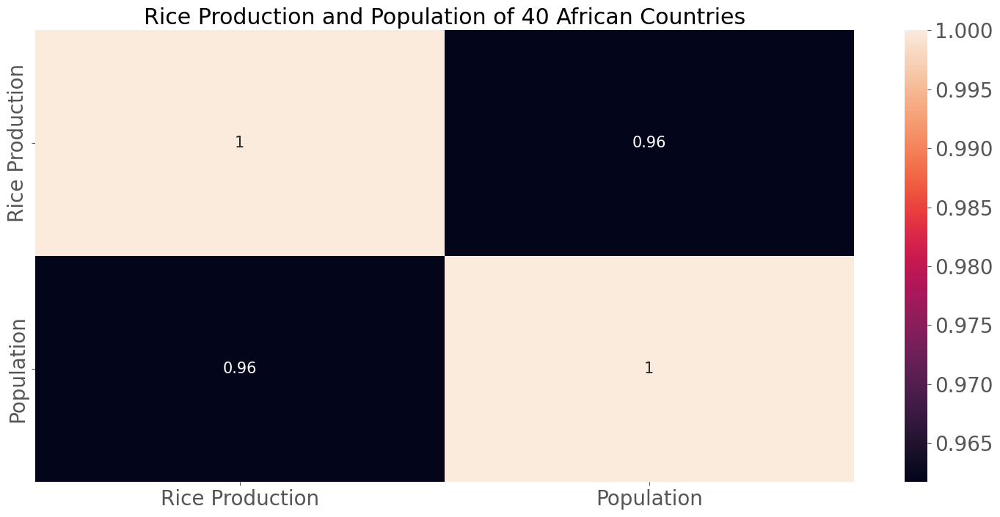

In [125]:
#Visualing the correlation
plt.figure(figsize=[18,8])
Rice_production_and_Population_Matrix = Rice_production_and_Population.corr(method = 'pearson')
sns.heatmap(Rice_production_and_Population_Matrix, annot = True)
plt.title('Rice Production and Population of 40 African Countries')
plt.rc('font', size=15)
plt.rc('xtick', labelsize=15) 
plt.rc('ytick', labelsize=15)
plt.show()

We can see there is a strong correlation between rice production and population

In [126]:
Rice_production_and_Population

,Rice Production,Population
Year,,
2004,225.818182,1.729988e+07
2005,253.787879,1.773252e+07
2006,274.848485,1.818038e+07
2007,249.878788,1.864532e+07
2008,307.818182,1.912565e+07
2009,327.151515,1.962065e+07
2010,383.454545,2.012751e+07
2011,361.757576,2.064788e+07
2012,398.484848,2.118110e+07


From the above table we can see the increase in Rice production as the Population increases
Rice production started from average value of  225.818182 kiloton in 2004 and increased to 402.272727 kiloton just as the population increased

In [127]:
x = np.array([225.818182, 253.787879, 274.848485, 249.878788, 307.818182, 327.151515, 383.454545,
              361.757576, 398.484848, 402.272727])

y = np.array([1.729988e+07, 1.773252e+07, 1.818038e+07, 1.864532e+07, 1.912565e+07, 1.962065e+07,
              2.012751e+07, 2.064788e+07, 2.118110e+07, 2.172376e+07])

pearsonr(x, y)

PearsonRResult(statistic=0.9616987161900885, pvalue=8.989369037815953e-06)

In [128]:
pd.DataFrame(pearsonr(y,x),index= (['Statistic', 'P-Value']), columns=['Pearson Correlation'])

,Pearson Correlation
Statistic,0.961699
P-Value,0.000009


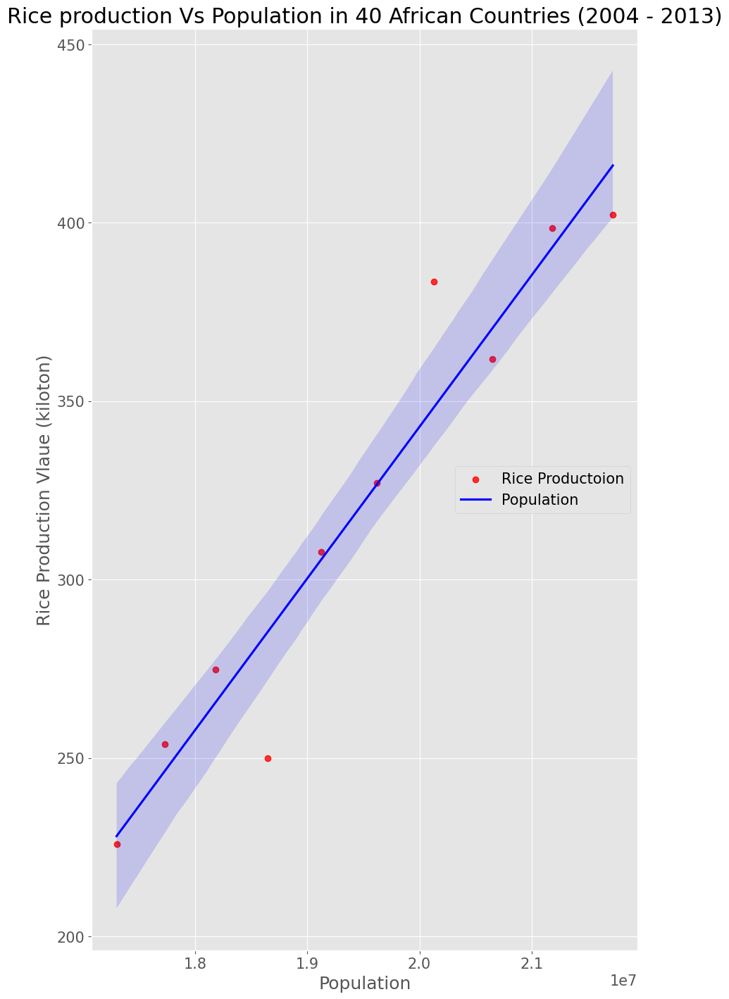

In [129]:
# Visualization using scatterplot to show relationshiip between rice production and population
sns.regplot( x='Population', y='Rice Production', data=Rice_production_and_Population, scatter_kws={'color': 'red'}, 
            line_kws={'color': 'blue'})
plt.title('Rice production Vs Population in 40 African Countries (2004 - 2013)')
plt.ylabel('Rice Production Vlaue (kiloton)')
plt.xlabel('Population')
plt.legend(['Rice Productoion', 'Population'], loc='center right')

Conclusively we can say that as population increase rice production increased

In [130]:
# Creating a dataframe to store the sum of yearly production value

foodprodd = pd.DataFrame(food_production.groupby(['Year'])['Value'].sum()).reset_index()
foodprodd

,Year,Value
0,2004,663006
1,2005,691257
2,2006,718602
3,2007,705659
4,2008,736804
5,2009,746870
6,2010,786466
7,2011,812214
8,2012,841667
9,2013,872571


In [131]:
# Renaming the Value column of foodproduction
foodprodd.rename(columns={'Value': 'Production Value'}, inplace = True)

In [132]:
# Creating a dataframe to store the sum of yearly supply value
foodsuppply = pd.DataFrame(food_supply.groupby(['Year'])['Value'].sum()).reset_index()
foodsuppply

,Year,Value
0,2004,107740
1,2005,108418
2,2006,109386
3,2007,110149
4,2008,110734
5,2009,111700
6,2010,112383
7,2011,113194
8,2012,113744
9,2013,113951


In [133]:
# Renaming the Value column of food supply
foodsuppply.rename(columns={'Value': 'Supply Value'}, inplace = True)
# Renaming the Year column of food supply to enable be delete it 
foodsuppply.rename(columns={'Year': 'year'}, inplace = True)

In [588]:
foodsuppply

,year,Supply Value
0,2004,107740
1,2005,108418
2,2006,109386
3,2007,110149
4,2008,110734
5,2009,111700
6,2010,112383
7,2011,113194
8,2012,113744
9,2013,113951


In [134]:
Rice_production_and_Supply=pd.concat([foodprodd, foodsuppply], axis=1)
Rice_production_and_Supply

,Year,Production Value,year,Supply Value
0,2004,663006,2004,107740
1,2005,691257,2005,108418
2,2006,718602,2006,109386
3,2007,705659,2007,110149
4,2008,736804,2008,110734
5,2009,746870,2009,111700
6,2010,786466,2010,112383
7,2011,812214,2011,113194
8,2012,841667,2012,113744
9,2013,872571,2013,113951


In [135]:
# Removing one of the year column
Rice_production_and_Supply=Rice_production_and_Supply.drop('year', axis = 1)
Rice_production_and_Supply

,Year,Production Value,Supply Value
0,2004,663006,107740
1,2005,691257,108418
2,2006,718602,109386
3,2007,705659,110149
4,2008,736804,110734
5,2009,746870,111700
6,2010,786466,112383
7,2011,812214,113194
8,2012,841667,113744
9,2013,872571,113951


In [136]:
Rice_production_and_Supply.corr(method = 'pearson')

,Year,Production Value,Supply Value
Year,1.000000,0.980439,0.995472
Production Value,0.980439,1.000000,0.965112
Supply Value,0.995472,0.965112,1.000000


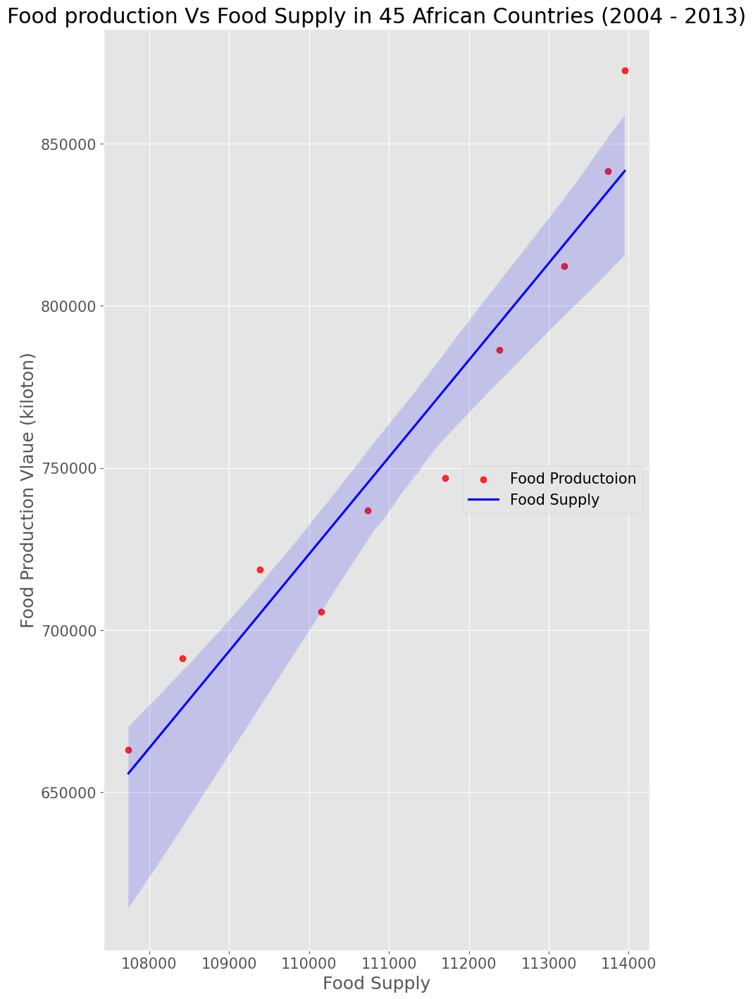

In [137]:
# Visualization using scatterplot to show relationshiip between food production and supply
sns.regplot( x='Supply Value', y='Production Value', data=Rice_production_and_Supply, scatter_kws={'color': 'red'}, 
            line_kws={'color': 'blue'})
plt.title('Food production Vs Food Supply in 45 African Countries (2004 - 2013)')
plt.ylabel('Food Production Vlaue (kiloton)')
plt.xlabel('Food Supply')
plt.legend(['Food Productoion', 'Food Supply'], loc='center right')

We can see that food production is higher than food supply

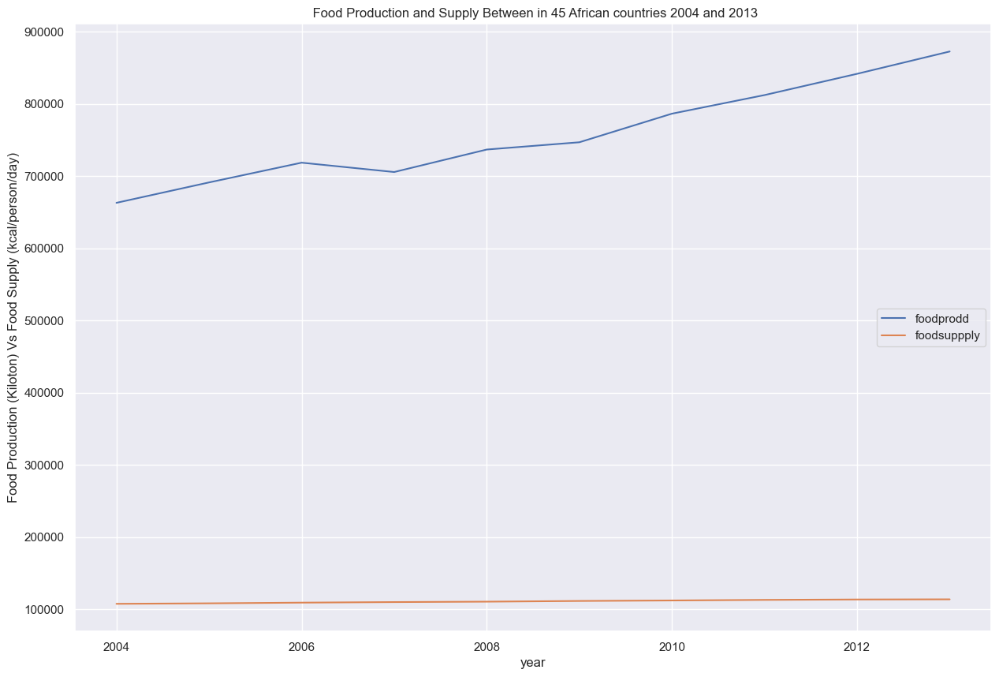

In [138]:
# Visualization to show the food production and food supply 
sns.set(rc={"figure.figsize":(15, 10)})

ax =foodprodd.plot(y='Production Value', x='Year')
foodsuppply.plot(ax=ax, y='Supply Value', x='year')
plt.ylabel('Food Production (Kiloton) Vs Food Supply (kcal/person/day)')
plt.title(' Food Production and Supply Between in 45 African countries 2004 and 2013')
plt.legend(['foodprodd', 'foodsuppply'], loc='center right')
plt.show()

## Conclusion / Insights

- Nigeria is the Top food producing country in Africa between 2004 to 2013 with a toal food production of 1,628,030 kiloton. followed by Egypt with total of 877,498 kiloton  and South Africa with total of 579,592.


- Cabo Verde, Sao Tome and Principe	and Djibouti were the coutries least food producing country in Africa between 2004 to 2013 witha food production of 1658 kt, 1152 kt, 666kt respectively.


- Cassava and products is the top most produced food item in Africa from 2004 to 2013 followed by Sugar cane, Maize and products, Yams, Vegetables, Other.


- The least produced food items are Cloves, Molluscs/Other, Pepper, Fish/Liver Oil, Aquatic Animals/Others. 


- Cassava and products is the top food prodcued in Nigeria from 2004 to 2013 with a total of 452,881 kiloton followed by Yam with total of 349,519 kiloton, while Beverages, Fermented produced is 93,839 kiloton. 


- Sugar cane is the top food prodcued in Egypt from 2004 to 2013 with a total of 160,973 kiloton followed by Tomatoes and products with total of 85,505 kiloton, while Vegetables, Other is 85,271 kiloton.


- Sugar cane is the most produced food in South Africa from 2004 to 2013 with a total of 188,396 kiloton, followed by Maize and products with total 107,343 kiloton, Milk - Excluding Butter 30965 kiloton.


- Sugarcane is the 2nd most produced food in 45 African countries from 2004 to 2013. And its the top most produced food by South Africa surprisenly its also the top produced food in Egypt. Further analysis  shows that South Africa is the overall top sugarcane producing country from 2004 to 2013 with a total production of 188,396 kiloton follwed by Egypt with total of 160,973 kiloton and Sudan with 69,371 kiloton.


- Nigeria is the top cassava producing country with a total of 452,881 kiloton followed by Ghana with total cassava production of 121,026 and Angola with 121,026. 


- South Africa is the top Maize producing country from 2004 to 2013 having a total production of 107,343 kt followed by Nigeria with total of 76,898 kt, Egypt 70,993 kt. 


- Egypt is the top rice producing country having a total production of 40,370 kiloton followed by Nigeria with 26,964 kiloton and Madagascar with 26,118 kiloton.


- Food production increased as the year increased.


- 39 countries out of 45 produced high amount amount of food  between 2004 and 2013.


- Egypt is the top food supplying country in Africa from 2004 to 2013 followed closely by Tunisia, and Morocco. Despite Nigeria, Egypt, and South Africa been the top three food producing countries between 2004 to 2013 they were not the top food supply countries.  However, SouthAfrica was the 6th supplying country while Nigeria was the 12th supplying country. 


- Food supply kept increasing by the year


- There was an outlier in 2012. Egypt had significantly higher food available for consumption than other African countries.


- On the hypothesis testing  there is strong correlation between rice production and population. As population increase rice production increased. Rice production started from average value of  225.818182 kiloton in 2004 and increased to 402.272727 kiloton just as the population increased
